In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import os,sys, gc
import keras

dirpath = os.getcwd().split("code")[0]+"code/"
sys.path.append(dirpath)
from pre_process import clean_LC,generate_representation
from evaluation import calculate_metrics, evaluate_metadata, evaluate_metadata_raw

folder = "../../KOI_Data/"
folder_lc = "/work/work_teamEXOPLANET/KOI_LC/"

Using TensorFlow backend.
/users/fmena/anaconda3/envs/tesis/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/users/fmena/anaconda3/envs/tesis/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:520: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/users/fmena/anaconda3/envs/tesis/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:521: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/users/fmena/anaconda3/

### Load Metadata and pre-process

In [2]:
def impute_on_pandas(df):
    return df.fillna(df.median(),inplace=False)

df_meta = pd.read_csv(folder+"/kepler_dataset.csv")
all_labels = df_meta["NExScI Disposition"]
mask_conf = (all_labels=="CONFIRMED").values
mask_fp = (all_labels=="FALSE POSITIVE").values
mask_cand = (all_labels=="CANDIDATE").values

metadata_used = ["Period", "Duration", "Time of Transit Epoch", 
                 "Inclination", "Transit Number",
                 "Teq", "r/R", "a/R", #"Semi-major Axis"
                 "Limb Darkening Coeff1", "Limb Darkening Coeff2", "Fitted Stellar Density",
                "Teff","Stellar Radius", "Stellar Mass"]
#dividir duration por 24??
df_meta["Duration"] = df_meta["Duration"]/24

df_meta_obj = df_meta[metadata_used]
mask_nan = pd.isna(df_meta_obj)

df_meta_obj = impute_on_pandas(df_meta_obj)

df_meta_obj.head()

,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass
0,8.884923,0.086252,169.991686,89.89,153,770.0,0.114,36.466,0.497,0.204,11.62061,5332.0,0.843,0.821
1,5.092465,0.152458,357.535940,89.14,225,844.0,0.014,10.670,0.551,0.165,0.88510,5037.0,0.751,0.727
2,275.073650,0.140417,315.248600,89.93,4,303.0,0.014,512.000,0.437,0.243,33.55994,5604.0,1.187,0.864
3,8.460439,0.197288,133.774490,85.68,164,804.0,0.478,14.087,0.299,0.306,0.73874,5951.0,0.702,0.796
4,21.761298,0.051792,166.540438,89.95,62,486.0,0.032,137.070,0.627,0.108,102.86534,4859.0,0.720,0.781


In [3]:
df_sets = pd.read_csv(folder+"/koi_sets_unb.csv") 
mask_train = (df_sets["Set"] == "Train").values
mask_test = (df_sets["Set"] == "Test").values
mask_unlabeled = (df_sets["Set"] == "Unlabeled").values

mask_train_conf = mask_train & mask_conf
mask_test_conf = mask_test & mask_conf

In [4]:
Y_train = df_meta_obj.values[mask_train_conf]
Y_test = df_meta_obj.values[mask_test_conf]
Y_train.shape

(1776, 14)

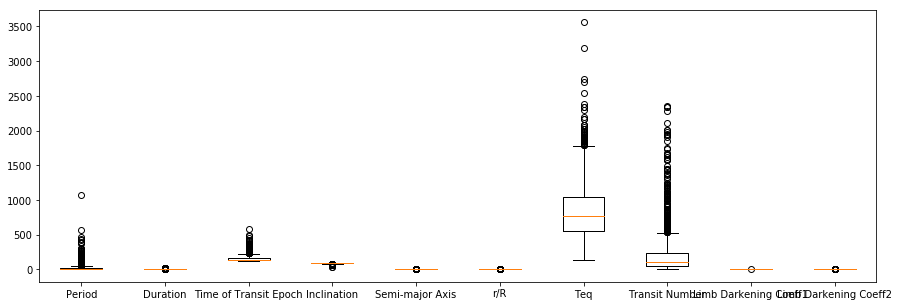

,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
count,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000
mean,26.770958,4.278104,156.863733,87.975490,0.141385,0.025715,840.867680,207.111486,0.436031,0.242360
std,53.253481,2.712936,42.055219,3.507531,0.151109,0.022297,396.090465,296.638191,0.099668,0.067242
min,0.341842,0.427900,120.565925,40.980000,0.006000,0.005000,129.000000,3.000000,0.210000,0.034000
25%,5.012505,2.524075,134.249478,87.580000,0.055000,0.014000,553.000000,47.000000,0.359000,0.204000
50%,11.326234,3.552450,140.587130,89.100000,0.095000,0.021000,771.000000,107.000000,0.419000,0.260000
75%,25.372859,5.252250,170.977483,89.810000,0.168000,0.029000,1046.000000,242.000000,0.497000,0.289000
max,1071.232624,24.420000,589.719750,90.000000,1.860000,0.415000,3559.000000,2354.000000,0.731000,0.442000


In [5]:
### boxplot de las variables..
plt.figure(figsize=(15,5))
plt.boxplot(Y_train)
plt.xticks(np.arange(len(metadata_used))+1,metadata_used)
plt.show()
aux_df = pd.DataFrame(Y_train)
aux_df.columns = metadata_used
aux_df.describe()

In [5]:
#pre-process: scale metadata
from sklearn.preprocessing import StandardScaler, RobustScaler
#scaler_meta = RobustScaler()
scaler_meta = StandardScaler()

Ystd_train = scaler_meta.fit_transform(Y_train)
Ystd_test = scaler_meta.transform(Y_test)

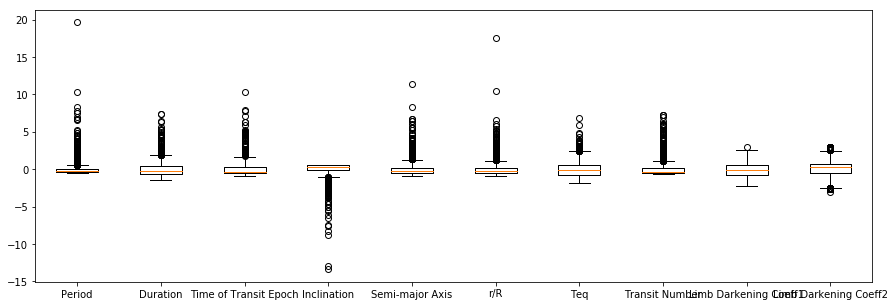

,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
count,1.776000e+03,1.776000e+03,1.776000e+03,1.776000e+03,1.776000e+03,1.776000e+03,1.776000e+03,1.776000e+03,1.776000e+03,1.776000e+03
mean,-7.285839e-17,6.227188e-16,6.990686e-15,-7.418934e-14,-7.514009e-17,-3.722201e-15,-5.188542e-18,-4.071130e-17,-1.323991e-14,2.691253e-14
std,1.000282e+00,1.000282e+00,1.000282e+00,1.000282e+00,1.000282e+00,1.000282e+00,1.000282e+00,1.000282e+00,1.000282e+00,1.000282e+00
min,-4.964288e-01,-1.419601e+00,-8.633419e-01,-1.340223e+01,-8.961943e-01,-9.292957e-01,-1.797741e+00,-6.882761e-01,-2.268470e+00,-3.099549e+00
25%,-4.086978e-01,-6.467246e-01,-5.378791e-01,-1.127862e-01,-5.718343e-01,-5.255484e-01,-7.269773e-01,-5.399055e-01,-7.730908e-01,-5.706383e-01
50%,-2.901045e-01,-2.675544e-01,-3.871383e-01,3.206891e-01,-3.070507e-01,-2.115228e-01,-1.764429e-01,-3.375819e-01,-1.709246e-01,2.624147e-01
75%,-2.626105e-02,3.591757e-01,3.356950e-01,5.231677e-01,1.761795e-01,1.473637e-01,5.180385e-01,1.176461e-01,6.118915e-01,6.938172e-01
max,1.961855e+01,7.426481e+00,1.029546e+01,5.773521e-01,1.137653e+01,1.746364e+01,6.864336e+00,7.239436e+00,2.960340e+00,2.969837e+00


In [6]:
### boxplot de las variables..
plt.figure(figsize=(15,5))
plt.boxplot(Ystd_train)
plt.xticks(np.arange(len(metadata_used))+1,metadata_used)
plt.show()
aux_df = pd.DataFrame(Ystd_train)
aux_df.columns = metadata_used
aux_df.describe()

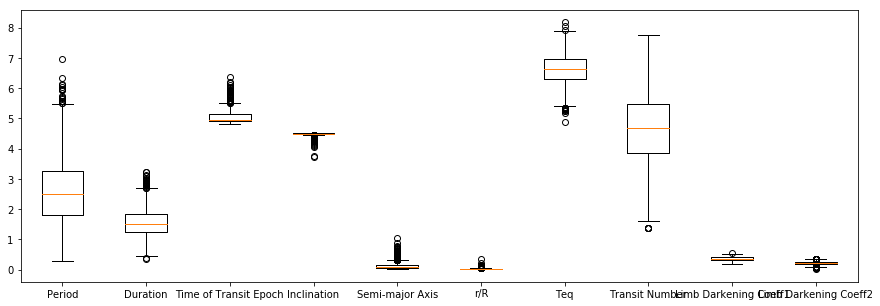

In [7]:
### boxplot de las variables..
plt.figure(figsize=(15,5))
plt.boxplot(np.log(Y_train+1))
plt.xticks(np.arange(len(metadata_used))+1,metadata_used)
plt.show()

In [6]:
#probar agregar errores
metadata_errors = ["Period err1", "Period err2", "Duration err1", "Duration err2", "Time err1", "Time err2",
                  "Inclination err1", "Inclination err2", "Semi-major Axus err1", "Semi-major Axis err2",
                  "r/R err1", "r/R err2", "Teq err1", "Teq err2", "Transit Number"]
aux = df_meta[metadata_errors].abs()

df_meta_err = pd.DataFrame()
df_meta_err["Period err"] = (aux["Period err1"]+aux["Period err2"])/2
df_meta_err["Duration err"] = (aux["Duration err1"]+aux["Duration err2"])/2
df_meta_err["Time err"] = (aux["Time err1"]+aux["Time err2"])/2
df_meta_err["Inclination err"] = (aux["Inclination err1"]+aux["Inclination err2"])/2
df_meta_err["Semi-major Axis err"] = (aux["Semi-major Axus err1"]+aux["Semi-major Axis err2"])/2
df_meta_err["r/R err"] = (aux["r/R err1"]+aux["r/R err2"])/2
df_meta_err["Teq err"] = (aux["Teq err1"]+aux["Teq err2"])/2
df_meta_err["Number err"] = np.nan
df_meta_err["Coeff1 err"] = np.nan
df_meta_err["Coeff2 err"] = np.nan

mask_nan_err = pd.isna(df_meta_err)

df_meta_err.head()

,Period err,Duration err,Time err,Inclination err,Semi-major Axis err,r/R err,Teq err,Number err,Coeff1 err,Coeff2 err
0,1.636000e-06,0.007,0.000144,NaN,NaN,0.000331,NaN,NaN,NaN,NaN
1,4.390000e-05,0.199,0.005000,NaN,NaN,0.000661,NaN,NaN,NaN,NaN
2,3.900000e-02,5.500,0.094000,NaN,NaN,0.001246,NaN,NaN,NaN,NaN
3,6.290000e-07,0.003,0.000063,NaN,NaN,0.010500,NaN,NaN,NaN,NaN
4,1.727000e-05,0.026,0.000641,NaN,NaN,0.000770,NaN,NaN,NaN,NaN


In [7]:
Y_train_err = df_meta_err.values[mask_train_conf]
#Y_test_err = df_meta_err.values[mask_test_conf]
Y_train_err.shape

(1776, 10)

/users/fmena/anaconda3/envs/tesis/lib/python3.5/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)


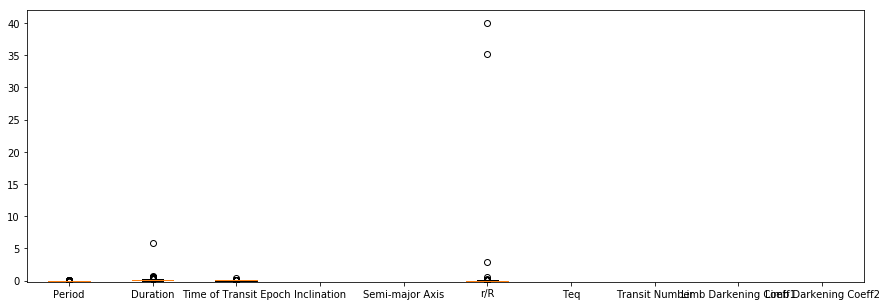

,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
count,5.050000e+02,505.000000,505.000000,0.0,0.0,505.000000,0.0,0.0,0.0,0.0
mean,2.723024e-04,0.129247,0.004544,NaN,NaN,0.157463,NaN,NaN,NaN,NaN
std,2.307667e-03,0.276396,0.016095,NaN,NaN,2.372793,NaN,NaN,NaN,NaN
min,7.100000e-08,0.000730,0.000025,NaN,NaN,0.000066,NaN,NaN,NaN,NaN
25%,1.266000e-05,0.054000,0.001000,NaN,NaN,0.000468,NaN,NaN,NaN,NaN
50%,3.311000e-05,0.088000,0.003000,NaN,NaN,0.000831,NaN,NaN,NaN,NaN
75%,1.205000e-04,0.148000,0.005000,NaN,NaN,0.002000,NaN,NaN,NaN,NaN
max,5.100000e-02,5.900000,0.345000,NaN,NaN,40.034500,NaN,NaN,NaN,NaN


In [43]:
### boxplot de las variables..
plt.figure(figsize=(15,5))
plt.boxplot(Y_test_err)
plt.xticks(np.arange(len(metadata_used))+1,metadata_used)
plt.ylim(-0.2)
plt.show()
aux_df = pd.DataFrame(Y_test_err)
aux_df.columns = metadata_used
aux_df.describe()

In [8]:
Ystd_train_err = Y_train_err/ scaler_meta.scale_
#Ystd_test_err = Y_test_err/ scaler_meta.scale_

/users/fmena/anaconda3/envs/tesis/lib/python3.5/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)


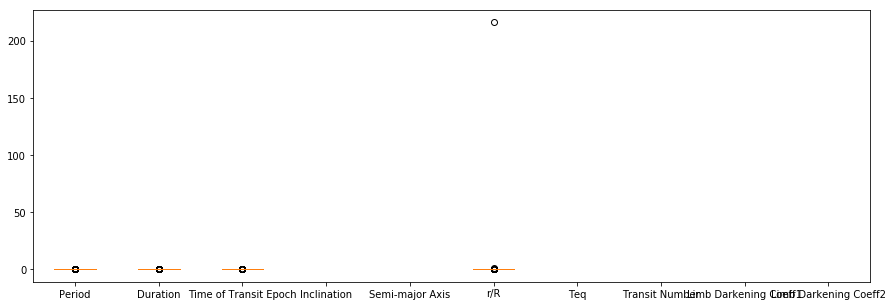

,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
count,1.776000e+03,1.776000e+03,1.776000e+03,0.0,0.0,1776.000000,0.0,0.0,0.0,0.0
mean,7.297788e-14,6.433805e-06,1.560230e-10,NaN,NaN,0.131200,NaN,NaN,NaN,NaN
std,2.735139e-13,6.182039e-06,2.623024e-10,NaN,NaN,5.128310,NaN,NaN,NaN,NaN
min,1.014196e-17,4.219924e-08,3.351447e-13,NaN,NaN,0.000269,NaN,NaN,NaN,NaN
25%,4.099983e-15,2.705080e-06,3.852238e-11,NaN,NaN,0.002940,NaN,NaN,NaN,NaN
50%,1.438656e-14,4.760940e-06,1.155671e-10,NaN,NaN,0.004894,NaN,NaN,NaN,NaN
75%,4.654974e-14,8.331645e-06,1.926119e-10,NaN,NaN,0.011959,NaN,NaN,NaN,NaN
max,5.258796e-12,6.492191e-05,4.853820e-09,NaN,NaN,216.124642,NaN,NaN,NaN,NaN


In [86]:
### boxplot de las variables..
plt.figure(figsize=(15,5))
plt.boxplot(Ystd_train_err)
plt.xticks(np.arange(len(metadata_used))+1,metadata_used)
#plt.ylim(-0.2,1)
plt.show()
aux_df = pd.DataFrame(Ystd_train_err)
aux_df.columns = metadata_used
aux_df.describe()

In [9]:
Ystd_train_err[mask_nan_err[mask_train_conf]] = np.nanmin(Ystd_train_err)


In [11]:
Ystd_train_err[mask_nan_err[mask_train_conf]] = 1
#Ystd_test_err[mask_nan_err[mask_test_conf]] = 1

from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
scaler_meta_err = MinMaxScaler(feature_range=(1, 100)) #o un shift de 1...

Ystd_train_err = scaler_meta_err.fit_transform(Ystd_train_err)
#Ystd_test_err = scaler_meta_err.transform(Ystd_test_err)

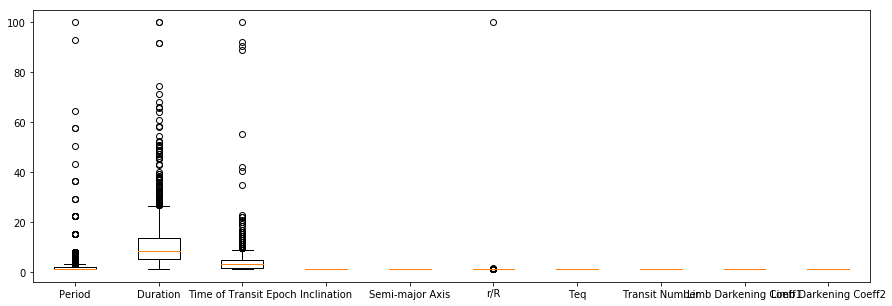

,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
count,1776.000000,1776.000000,1776.000000,1776.0,1776.0,1776.000000,1776.0,1776.0,1776.0,1776.0
mean,2.373664,10.752956,4.175677,1.0,1.0,1.059976,1.0,1.0,1.0,1.0
std,5.149073,9.433177,5.350369,0.0,0.0,2.349123,0.0,0.0,0.0,0.0
min,1.000000,1.000000,1.000000,1.0,1.0,1.000000,1.0,1.0,1.0,1.0
25%,1.076994,5.063291,1.778932,1.0,1.0,1.001224,1.0,1.0,1.0,1.0
50%,1.270645,8.200330,3.350469,1.0,1.0,1.002119,1.0,1.0,1.0,1.0
75%,1.876138,13.648872,4.922007,1.0,1.0,1.005355,1.0,1.0,1.0,1.0
max,100.000000,100.000000,100.000000,1.0,1.0,100.000000,1.0,1.0,1.0,1.0


In [12]:
### boxplot de las variables..
plt.figure(figsize=(15,5))
plt.boxplot(Ystd_train_err)
plt.xticks(np.arange(len(metadata_used))+1,metadata_used)
plt.show()
aux_df = pd.DataFrame(Ystd_train_err)
aux_df.columns = metadata_used
aux_df.describe()

### Read light curves processed (detrended)

(8054, 71427)


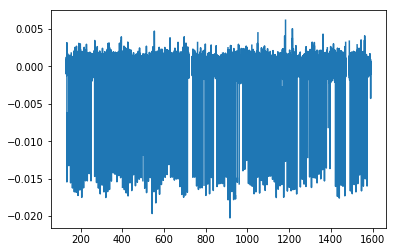

In [6]:
time_kepler = np.load(folder_lc+"npy/KOI_LC_time.npy")
#lc_kepler = np.load(folder_lc+"npy/KOI_LC_init.npy" )
process_lc = np.load(folder_lc+'/cleaned/LC_kepler_processed.npy')
N, T = time_kepler.shape
print((N,T))

plt.plot(time_kepler[0],process_lc[0])
plt.show()

In [7]:
### mascara para solo confirmados???
time_kepler = time_kepler[mask_conf]
process_lc = process_lc[mask_conf]
N, T = time_kepler.shape
print((N,T))

(2281, 71427)


## Generate representation
> Continous values (with zeros)  
>> **Selected:** Coupled values (adding time) + delta time

In [8]:
for i in range(N):
    if i%1000 == 0:
        print("Va en el ",i)
    time_kepler[i], process_lc[i] = generate_representation(time_kepler[i], process_lc[i])

Va en el  0
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423941 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampli

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform samplin

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform samplin

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get 

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

In [9]:
#borrar nans... arreglo variable
coupled_lc = []
coupled_time = []
delta_time = []
for i in range(N):
    mask_nan_aux = np.isnan(process_lc[i])
    coupled_lc.append(process_lc[i][~mask_nan_aux])
    
    time = time_kepler[i][~mask_nan_aux]
    # calculate delta time --> this could be done after padding is done..
    delta_time.append(np.hstack([[0],np.diff(time)]))
    coupled_time.append(time)
    
coupled_lc = np.asarray(coupled_lc)
coupled_time = np.asarray(coupled_time)
delta_time = np.asarray(delta_time)
coupled_time

array([array([ 131.5127147 ,  131.53314799,  131.55358129, ..., 1590.94020852,
       1590.96064181, 1590.98107511]),
       array([ 131.5126641 ,  131.53309739,  131.55353069, ..., 1590.94017122,
       1590.96060451, 1590.98103781]),
       array([ 131.5127088 ,  131.53314209,  131.55357539, ..., 1590.94023102,
       1590.96066431, 1590.98109761]),
       ...,
       array([ 131.5119906,  131.5324239,  131.5528572, ..., 1590.9400861,
       1590.9605194, 1590.9809527]),
       array([ 131.5119561,  131.5323894,  131.5528227, ..., 1590.9400454,
       1590.9604787, 1590.980912 ]),
       array([ 131.5119643,  131.5323976,  131.5528309, ..., 1590.9400596,
       1590.9604929, 1590.9809262])], dtype=object)

### Process --scale and center
> center?  
> With what value scale? (min, iqr, std)  
> Multiplicar por -1 por los max pooling?
>> **Selected:** normalizar (unit variance) --already median centered 

In [10]:
#pre-process seleccionado

coupled_lc_scaled = []
for i in range(coupled_lc.shape[0]):
    std_i = coupled_lc[i].std(keepdims=True)
    coupled_lc_scaled.append( coupled_lc[i]/std_i )
coupled_lc_scaled = np.asarray(coupled_lc_scaled)
coupled_lc_scaled.shape

(2281,)

In [11]:
#flip/mirror cada curva de luz.. (así se duplican los datos..) time: tambn y shift del 0 que sobra..

flip_coupled_lc_scaled = []
flip_delta_time = []
for i in range(coupled_lc.shape[0]):    
    flip_coupled_lc_scaled.append( coupled_lc_scaled[i][::-1] )
    flip_delta_time.append(  np.hstack([[0], delta_time[i][1:][::-1]]) )
    
flip_coupled_lc_scaled = np.asarray(flip_coupled_lc_scaled)
flip_delta_time = np.asarray(flip_delta_time)


delta_time = np.concatenate([flip_delta_time,delta_time])
coupled_lc_scaled = np.concatenate([flip_coupled_lc_scaled,coupled_lc_scaled])

del flip_delta_time, flip_coupled_lc_scaled
gc.collect()
coupled_lc_scaled.shape

(4562,)

### Padding for Keras

In [12]:
lens_lc = list(map(len,coupled_time))
max_len = np.max(lens_lc)

max_len = 64482 #as were builded


## do padding with keras..
X_time = keras.preprocessing.sequence.pad_sequences(delta_time,maxlen=max_len, value=0,dtype='float32',padding='post')
X_lc_scaled = keras.preprocessing.sequence.pad_sequences(coupled_lc_scaled,maxlen=max_len, value=0,dtype='float32',padding='post')
print("Shape with padding: ", X_lc_scaled.shape)

#need data with extra dim
X_lc_scaled = np.expand_dims(np.squeeze(X_lc_scaled),axis=-1)
X_time = np.expand_dims(np.squeeze(X_time),axis=-1)

T = X_lc_scaled.shape[1]
channels = 2
print("Shape with extra-dim: ", X_lc_scaled.shape)

X_lc_scaled

Shape with padding:  (4562, 64482)
Shape with extra-dim:  (4562, 64482, 1)


array([[[-0.08730856],
        [-3.0120108 ],
        [ 0.06760287],
        ...,
        [ 0.        ],
        [ 0.        ],
        [ 0.        ]],

       [[-0.27543724],
        [-9.160291  ],
        [ 0.7185589 ],
        ...,
        [ 0.        ],
        [ 0.        ],
        [ 0.        ]],

       [[-0.15168639],
        [ 1.1390879 ],
        [-0.31746146],
        ...,
        [ 0.        ],
        [ 0.        ],
        [ 0.        ]],

       ...,

       [[-0.40176523],
        [ 0.55774933],
        [ 0.        ],
        ...,
        [ 0.        ],
        [ 0.        ],
        [ 0.        ]],

       [[-0.96442634],
        [ 1.0596648 ],
        [ 0.4071325 ],
        ...,
        [ 0.        ],
        [ 0.        ],
        [ 0.        ]],

       [[ 1.0009062 ],
        [ 0.29136676],
        [-1.8706189 ],
        ...,
        [ 0.        ],
        [ 0.        ],
        [ 0.        ]]], dtype=float32)

### Load Encoder

In [13]:
from keras import backend as K
from keras.models import Sequential, Model
from keras.layers import Input, Conv1D, Dense, Flatten, MaxPool1D, Reshape, UpSampling1D, Lambda, AveragePooling1D
from keras.layers import GlobalAveragePooling1D,GlobalMaxPool1D, TimeDistributed, GRU,LSTM, RepeatVector
from keras.layers import BatchNormalization, Dropout, ZeroPadding1D, ZeroPadding2D, Cropping1D, Cropping2D, Conv2D, Conv2DTranspose, MaxPool2D,UpSampling2D

from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

D_dim = Y_train.shape[1]

/users/fmena/anaconda3/envs/tesis/lib/python3.5/site-packages/keras/models.py:282: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 64482, 1)     0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, 64482, 1)     0                                            
__________________________________________________________________________________________________
model_1 (Model)                 (None, 2015, 128)    164056      input_3[0][0]                    
__________________________________________________________________________________________________
model_2 (Model)                 (None, 2015, 128)    164056      input_4[0][0]                    
__________________________________________________________________________________________________
concatenat

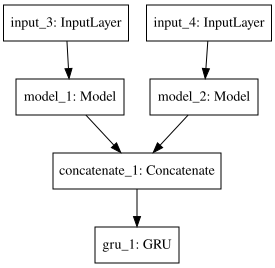

In [14]:
### load encoder..
#encoder_model = keras.models.load_model("./trained_models/En_op4.h5")
#encoder_model = keras.models.load_model("./trained_models/En_op5.h5")
#encoder_model = keras.models.load_model("./trained_models/En_op4_doubleE.h5")

encoder_model = keras.models.load_model("./trained_models/En_op4_double_GRU1.h5")
#encoder_model = keras.models.load_model("./trained_models/En_op4_double_GRU1_Tsim.h5")

encoder_model.summary()
SVG(model_to_dot(encoder_model).create(prog='dot', format='svg'))

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 64482, 1)     0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, 64482, 1)     0                                            
__________________________________________________________________________________________________
model_1 (Model)                 (None, 2015, 128)    164056      input_3[0][0]                    
__________________________________________________________________________________________________
model_2 (Model)                 (None, 2015, 128)    164056      input_4[0][0]                    
__________________________________________________________________________________________________
concatenat

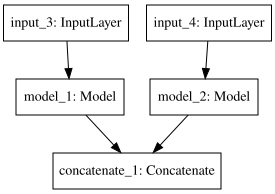

In [15]:
### just the concatenate part..
encoder_model.layers.pop()
encoder_model.outputs = [encoder_model.layers[-1].output]
encoder_model.layers[-1].outbound_nodes = []
encoder_model.summary()

SVG(model_to_dot(encoder_model).create(prog='dot', format='svg'))

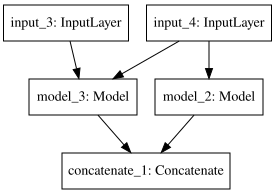

In [18]:
lc_it, time_it = encoder_model.inputs

code_time = encoder_model.get_layer("model_2")(time_it)
code_lc = encoder_model([lc_it, time_it])
out = keras.layers.Concatenate()([code_lc, code_time])

aux_encoder_model = Model(inputs=encoder_model.inputs, outputs=out)

SVG(model_to_dot(aux_encoder_model).create(prog='dot', format='svg'))

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 64482, 1)          0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 64482, 8)          48        
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 64482, 8)          328       
_________________________________________________________________
average_pooling1d_1 (Average (None, 32241, 8)          0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 32241, 16)         656       
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 32241, 16)         1296      
_________________________________________________________________
average_pooling1d_2 (Average (None, 16120, 16)         0         
__________

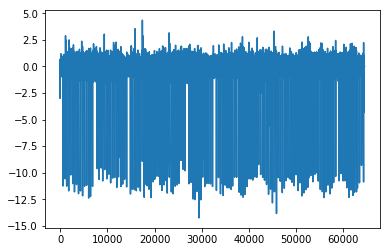

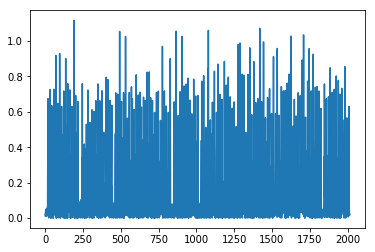

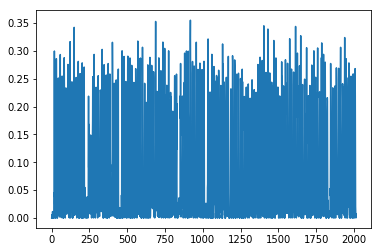

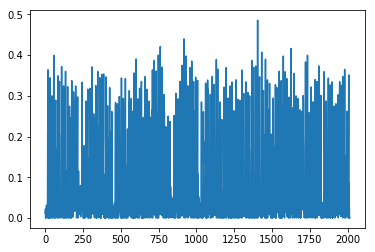

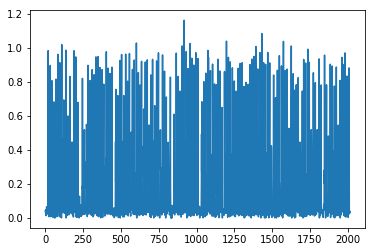

...

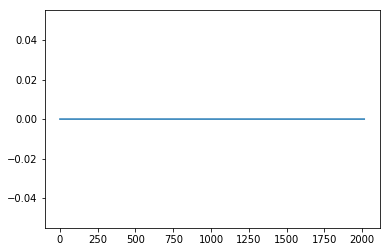

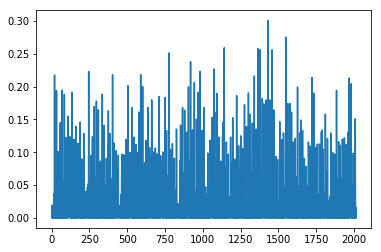

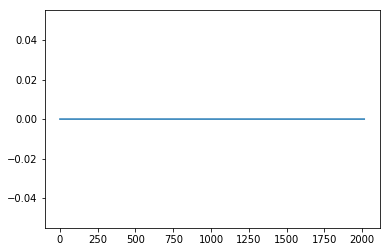

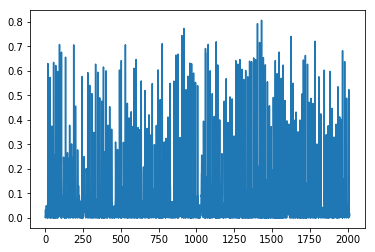

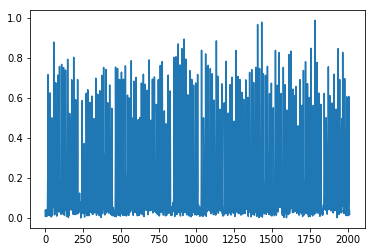

De 128 filtros, se utilizan 115 en promedio


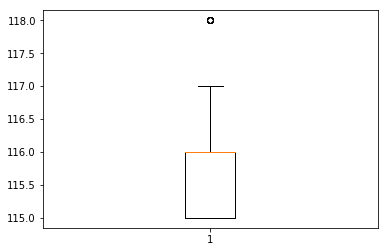

In [28]:
##light encoder?
lc_encoder = encoder_model.get_layer("model_1")
lc_encoder.summary()

X_lc_encoder  = lc_encoder.predict(X_lc_scaled[:N], batch_size=512)

n_s = 0
plt.plot(X_lc_scaled[n_s])
plt.show()

for i in range(X_lc_encoder.shape[-1]):
    plt.plot(X_lc_encoder[n_s][:,i])
    plt.show()
    
usados = []
for n in range(N):
    aux = 0
    for i in range(X_lc_encoder.shape[-1]):
        if np.sum(X_lc_encoder[n][:,i]) > 0:
            aux +=1
    usados.append(aux)
print("De %d filtros, se utilizan %d en promedio"%(X_lc_encoder.shape[-1],np.mean(usados)))
plt.boxplot(usados)
plt.show()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 64482, 1)          0         
_________________________________________________________________
conv1d_11 (Conv1D)           (None, 64482, 8)          48        
_________________________________________________________________
conv1d_12 (Conv1D)           (None, 64482, 8)          328       
_________________________________________________________________
average_pooling1d_6 (Average (None, 32241, 8)          0         
_________________________________________________________________
conv1d_13 (Conv1D)           (None, 32241, 16)         656       
_________________________________________________________________
conv1d_14 (Conv1D)           (None, 32241, 16)         1296      
_________________________________________________________________
average_pooling1d_7 (Average (None, 16120, 16)         0         
__________

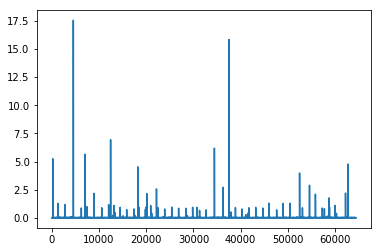

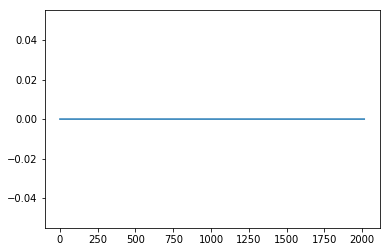

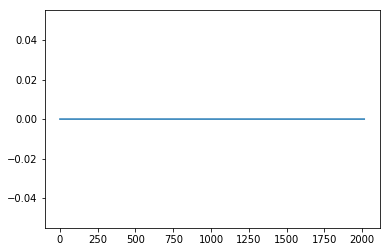

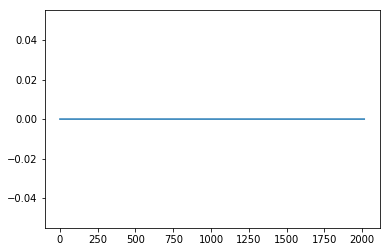

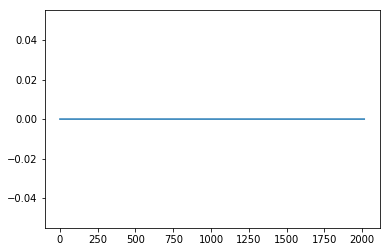

...

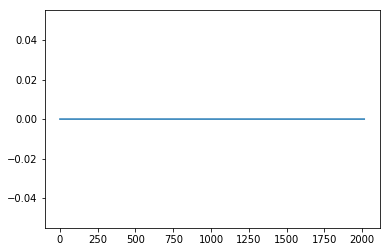

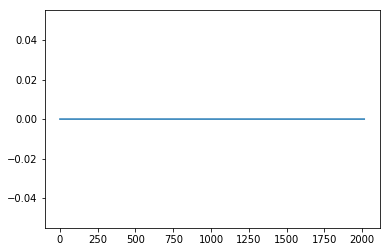

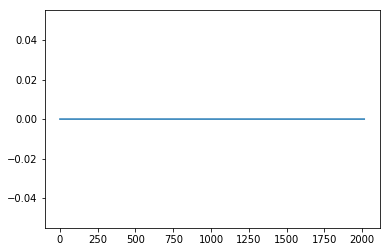

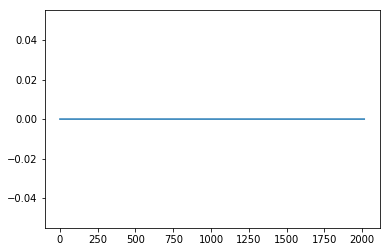

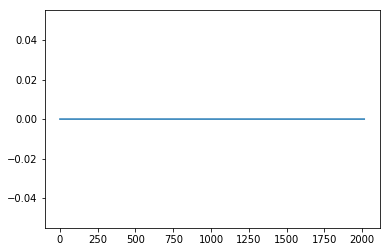

De 128 filtros, se utilizan 5 en promedio


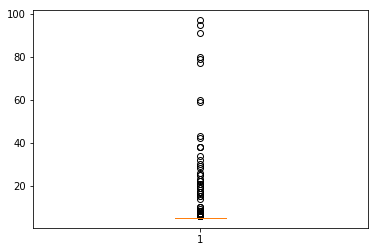

In [29]:
#time encoded..
time_encoder = encoder_model.get_layer("model_2")
time_encoder.summary()

X_time_encoder  = time_encoder.predict(X_time[:N], batch_size=512)

n_s = 0
plt.plot(X_time[n_s])
plt.show()

for i in range(X_time_encoder.shape[-1]):
    plt.plot(X_time_encoder[n_s][:,i])
    plt.show()
    
usados = []
for n in range(N):
    aux = 0
    for i in range(X_time_encoder.shape[-1]):
        if np.sum(X_time_encoder[n][:,i]) > 0:
            aux +=1
    usados.append(aux)
print("De %d filtros, se utilizan %d en promedio"%(X_time_encoder.shape[-1],np.mean(usados)))
plt.boxplot(usados)
plt.show() ### reducir los filtros de tiempo..

In [21]:
#encode light curves...
X_lc_scaled_real = X_lc_scaled[:N] 
X_lc_scaled_aug  = X_lc_scaled[N:] 
X_time_real = X_time[:N] 
X_time_aug  = X_time[N:] 

#X_enc_lc_real  = encoder_model.predict(np.concatenate([X_lc_scaled_real,X_time_real],axis=2), batch_size=512)
#X_enc_lc_aug  = encoder_model.predict(np.concatenate([X_lc_scaled_aug,X_time_aug],axis=2), batch_size=512)

#X_enc_lc_real  = encoder_model.predict([X_lc_scaled_real,X_time_real], batch_size=512)
#X_enc_lc_aug  = encoder_model.predict([X_lc_scaled_aug,X_time_aug], batch_size=512)


#aux_encoder_model
X_enc_lc_real  = aux_encoder_model.predict([X_lc_scaled_real,X_time_real], batch_size=512)
X_enc_lc_aug  = aux_encoder_model.predict([X_lc_scaled_aug,X_time_aug], batch_size=512)

X_enc_lc_real.shape

(2281, 2015, 256)

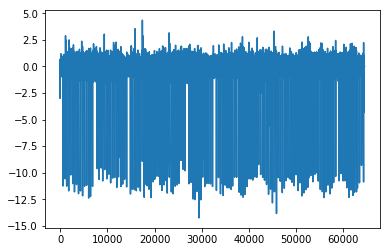

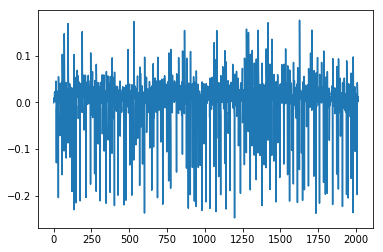

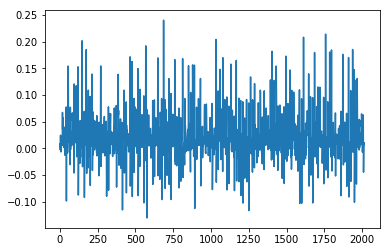

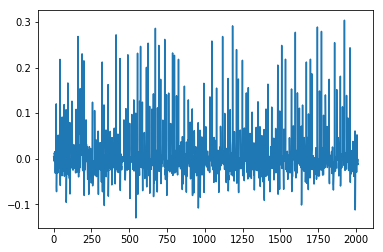

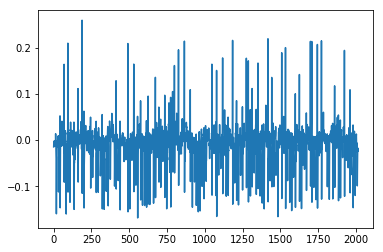

...

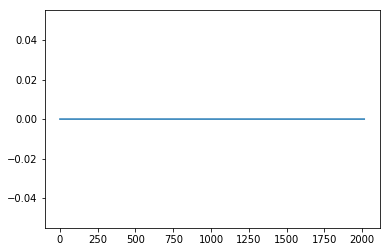

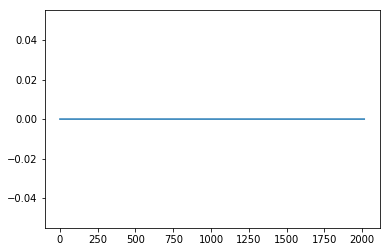

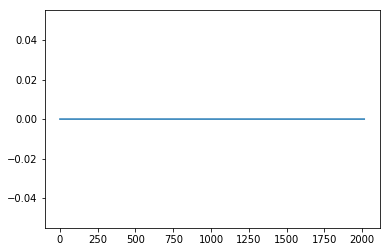

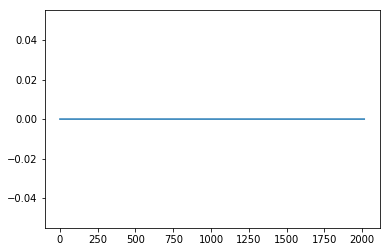

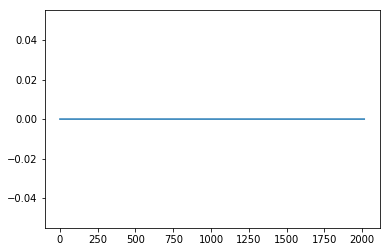

In [22]:
n_s = 0
plt.plot(X_lc_scaled_real[n_s])
plt.show()

for i in range(X_enc_lc_real.shape[-1]):
    plt.plot(X_enc_lc_real[n_s][:,i])
    plt.show()

In [23]:
X_train = np.concatenate([X_enc_lc_real[mask_train[mask_conf]], X_enc_lc_aug[mask_train[mask_conf]]], axis=0)
#X_train = np.concatenate([X_enc_lc_real[mask_train[:]], X_enc_lc_aug[mask_train[:]]], axis=0)

Ystd_train = np.tile(Ystd_train, (2,1))
#Ystd_train_err = np.tile(Ystd_train_err, (2,1))

X_test = X_enc_lc_real[mask_test[mask_conf]]
#X_test = X_enc_lc_real[mask_test_conf]

print("X train shape: ",X_train.shape)
print("X test shape: ",X_test.shape)
print("Y train shape: ",Ystd_train.shape)
print("Y test shape: ",Ystd_test.shape)

X train shape:  (3552, 2015, 256)
X test shape:  (505, 2015, 256)
Y train shape:  (3552, 14)
Y test shape:  (505, 14)


### Define Encoder-Metadata

In [24]:
import keras
from keras.models import Sequential
from keras.layers import *
import tensorflow as tf

def train_model(model,X,y,epochs=1,batch_size=32, val_split=0.0, verb=1):
    return model.fit(X,y, epochs=epochs, batch_size=batch_size, validation_split=val_split, verbose=verb)

#autoencoder.compile(loss=[mse_masked],optimizer='adam')
#autoencoder.compile(loss=[titled_loss(0.1)],optimizer='adam') #0.05

In [35]:
class KMaxPooling(keras.engine.Layer):
    """
    K-max pooling layer that extracts the k-highest activations from a sequence (2nd dimension). TensorFlow backend.
    """
    def __init__(self, k=1, **kwargs):
        super().__init__(**kwargs)
        self.input_spec = keras.engine.InputSpec(ndim=3)
        self.k = k

    def compute_output_shape(self, input_shape):
        return (input_shape[0], self.k, input_shape[2])

    def call(self, inputs):
        # swap last two dimensions since top_k will be applied along the last dimension
        shifted_input = tf.transpose(inputs, [0, 2, 1]) 
        # extract top_k, returns two tensors [values, indices]
        top_k = tf.nn.top_k(shifted_input, k=self.k, sorted=True, name=None)[0] 
        return tf.transpose(top_k, [0, 2, 1])

import math
def K_l(L,seq_len,k_top,layer=1): #dinamyc k-max
    return max(k_top, math.ceil( seq_len*(L-layer)/L) )

def add_conv_bloq(model, filters, kernel_s, BN=False, drop=0,padding='same',dil_r=1):
    model.add(Conv1D(filters, kernel_s, strides=1, padding=padding, activation='relu',dilation_rate=dil_r))
    if BN:
        model.add(BatchNormalization())
    if dil_r == 1:
        model.add(Conv1D(filters, kernel_s, strides=1, padding=padding, activation='relu',dilation_rate=dil_r))
        if BN:
            model.add(BatchNormalization())
    if drop != 0:
        model.add(Dropout(drop))

#build model functions..
def build_simple_model(inp_shape,out_shape, units, L =1, drop=0):
    model = Sequential()
    model.add(GlobalAveragePooling1D(input_shape=inp_shape))
    for l in range(L):
        model.add(Dense(units, activation='relu'))
        units = int(units/2)
        if drop > 0.0:
            model.add(Dropout(drop))
    model.add(Dense(out_shape, activation='linear'))
    return model

def build_rnn_model(inp_shape, out_shape, units, layers=1, bid=False, gru=True, drop=0, BN=False):
    #que achique las unidades?
    model = Sequential()
    model.add(InputLayer(input_shape=inp_shape))
    for i in range(layers):
        if gru:
            layer_rec = GRU(units, return_sequences=(i < layers - 1))
        else:
            layer_rec = LSTM(units, return_sequences=(i < layers - 1))            
        if bid:
            layer_rec = Bidirectional(layer_rec)
        
        model.add(layer_rec)
        if drop > 0.0:
            model.add(Dropout(drop))
    if BN:
        model.add(BatchNormalization())
    model.add(Dense(64,activation='relu'))
    if BN:
        model.add(BatchNormalization())
    if drop>0:
        model.add(Dropout(drop))
    model.add(Dense(out_shape, activation='linear'))
    return model

def build_cnn_model(inp_shape, out_shape, units, L=1, kernel_s =10,
                        pool=5,BN=False,conv_pool=False,drop=0,padding='same',dil_r=1, fixed=False): #parametros estructurales
    model = Sequential()
    model.add(InputLayer(input_shape=inp_shape))
    for _ in range(L):
        add_conv_bloq(model, units, kernel_s, BN=BN,drop=drop,padding=padding,dil_r=dil_r)
        if pool!= 0 and dil_r ==1:
            if conv_pool:
                model.add(Conv1D(filters, kernel_s, strides=pool, padding='valid'))
                if BN:
                    model.add(BatchNormalization())
            else:
                #model.add(MaxPool1D(pool_size=pool, strides=pool, padding='valid'))
                model.add(AveragePooling1D(pool_size=pool, strides=pool, padding='valid'))

        if dil_r != 1:
            dil_r = int(dil_r*2)
        else:
            if not fixed:
                units = int(units*2)
            
    if dil_r != 1:
        model.add(Lambda(lambda x: x[:, -1, :])) # o dejar el global
    else:
        model.add(GlobalAveragePooling1D())
    
    model.add(Dense(64,activation='relu'))
    if BN:
        model.add(BatchNormalization())
    if drop>0:
        model.add(Dropout(drop))
    model.add(Dense(out_shape, activation='linear'))
    return model

def build_kpool_model(inp_shape, out_shape, units, L=1,kernel_s =10, K_top=500,
                        BN = False, drop=0, padding='same', fixed=False): #parametros estructurales
    model = Sequential()
    model.add(InputLayer(input_shape=inp_shape))
    for l in range(L):
        add_conv_bloq(model, units, kernel_s, BN=BN,drop=drop,padding=padding)

        model.add(KMaxPooling(k = K_l(L, inp_shape[0], K_top, layer=l+1)))
        
        if not fixed:
            units = int(units*2)
    
    model.add(GlobalAveragePooling1D())  #u otra cosa
    
    model.add(Dense(64,activation='relu'))
    if BN:
        model.add(BatchNormalization())
    if drop>0:
        model.add(Dropout(drop))
    model.add(Dense(out_shape, activation='linear'))
    return model

### RNN model

In [36]:
model_gru = build_rnn_model(X_train.shape[1:], Y_train.shape[1], 128, layers=1, bid=False, gru=True, drop=0.2,BN=True)
model_gru.compile(loss='mse', optimizer='adam')
model_gru.summary()
hist = train_model(model_gru, X_train, Ystd_train, epochs=20, batch_size=64, val_split=0.2)

plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_gru.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
gru_4 (GRU)                  (None, 128)               147840    
_________________________________________________________________
dropout_6 (Dropout)          (None, 128)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 128)               512       
_________________________________________________________________
dense_11 (Dense)             (None, 64)                8256      
_________________________________________________________________
batch_normalization_2 (Batch (None, 64)                256       
_________________________________________________________________
dropout_7 (Dropout)          (None, 64)                0         
__________

KeyboardInterrupt: 

### CNN

In [ ]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.25,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)

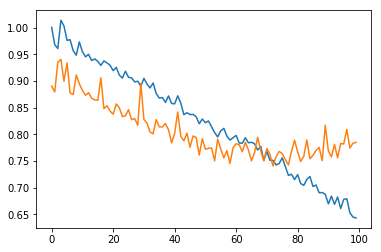

In [40]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

In [ ]:
model_cnn2 = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=True, drop=0.5,padding='valid',dil_r=1 )
model_cnn2.compile(loss='mse', optimizer='adam') 
model_cnn2.summary() #con BN

hist = train_model(model_cnn2, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)

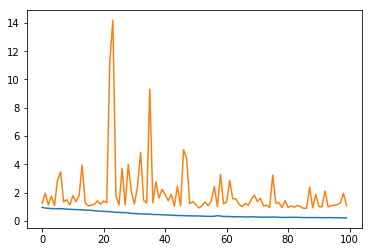

In [53]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

In [ ]:
model_cnn3 = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =8, pool=5, BN=False, drop=0.25,padding='valid',dil_r=1 )
model_cnn3.compile(loss='mse', optimizer='adam')
model_cnn3.summary() #pool y kernel size mas grandes..

hist = train_model(model_cnn3, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)

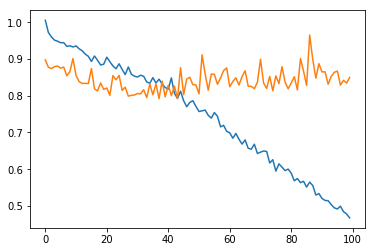

In [34]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

In [ ]:
model_cnn4 = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=4, 
                        kernel_s =5, pool=3, BN=False, drop=0.25,padding='valid',dil_r=1 )
model_cnn4.compile(loss='mse', optimizer='adam')
model_cnn4.summary()

hist = train_model(model_cnn4, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)

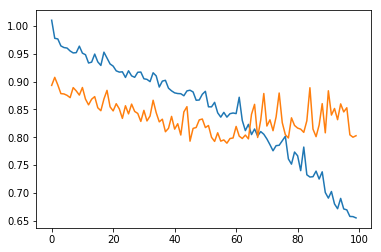

In [55]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

### CNN K-max pool

In [ ]:
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0.2, padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)

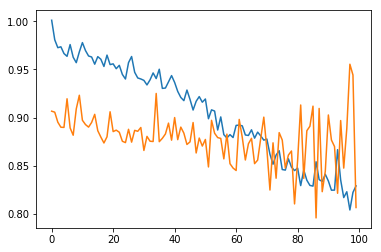

In [74]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

In [ ]:
#for probando
capas = [3]
units = [16,32]
Ks = [80,100]
kernel_s = [5]

#for L in capas:
for unit in units:
    for K in Ks:
        #for kernel in kernel_s:
        print("L, unit, K , kernel = ",L, unit,K, kernel)
        model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], unit, L=L,
                                kernel_s =kernel, K_top=K, BN = False, drop=0, padding='valid')
        model_kpool.compile(loss='mse', optimizer='adam')

        hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2,verb=0)
        plt.plot(hist.history["loss"])
        plt.plot(hist.history["val_loss"])
        plt.show()

        Y_test_hat = model_kpool.predict(X_test)
        print("**********************Test**********************")
        evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
             metadata_used=metadata_used)

### CNN casual+dilation 
> WaveNet

In [24]:
model_cnn_caus = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 64, L=6, 
                        kernel_s =5, BN=False, drop=0.2, padding='causal',dil_r=2 )
model_cnn_caus.compile(loss='mse', optimizer='adam')
model_cnn_caus.summary()

hist = train_model(model_cnn_caus, X_train, Ystd_train, epochs=50, batch_size=64, val_split=0.2)
Y_test_hat = model_cnn_caus.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 2015, 160)         0         
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 2015, 64)          51264     
_________________________________________________________________
dropout_1 (Dropout)          (None, 2015, 64)          0         
_________________________________________________________________
conv1d_8 (Conv1D)            (None, 2015, 64)          20544     
_________________________________________________________________
dropout_2 (Dropout)          (None, 2015, 64)          0         
_________________________________________________________________
conv1d_9 (Conv1D)            (None, 2015, 64)          20544     
_________________________________________________________________
dropout_3 (Dropout)          (None, 2015, 64)          0         
__________

,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,24.901142,1.968898,25.594453,2.028704,0.091702,0.010200,263.463945,172.124488,0.080046,0.051106,49.031469
MApE,352.606620,59.165149,14.617309,2.445475,117.982084,46.233615,41.196516,358.112287,18.573423,30.739957,104.167244
MSE,1876.968343,7.182675,1681.877822,11.116469,0.018818,0.000497,117277.918585,81907.637657,0.009810,0.004348,20276.273503
MeAE,17.287195,1.589824,19.047026,1.648267,0.071494,0.006910,219.924927,128.070267,0.073609,0.043385,38.776290
RMSLE,1.273697,0.452121,0.197287,0.041789,0.106896,0.019877,0.439522,1.362474,0.067624,0.054394,0.401568


{'MAE': [24.901142469985924,
  1.9688979298870728,
  25.594452549299007,
  2.028704346911742,
  0.09170211023859456,
  0.010200389715380008,
  263.4639450224319,
  172.1244884113274,
  0.0800464618819775,
  0.05110579621414147,
  49.031468548789306],
 'MApE': [352.6066201902816,
  59.16514862395871,
  14.617308581610914,
  2.4454746640194016,
  117.98208407186002,
  46.23361537762399,
  41.19651610128419,
  358.11228737249286,
  18.573423081948302,
  30.739957356897822,
  104.16724354219778],
 'MSE': [1876.9683427143561,
  7.18267548184554,
  1681.877822389248,
  11.11646922042457,
  0.0188184169869932,
  0.0004970705055845746,
  117277.91858502533,
  81907.63765749209,
  0.009809665701946777,
  0.004348178162087491,
  20276.273502565466],
 'MeAE': [17.287194939238283,
  1.5898236999511721,
  19.04702556152344,
  1.6482666015624972,
  0.0714942057132721,
  0.006909947469830514,
  219.9249267578125,
  128.0702667236328,
  0.07360896205902101,
  0.04338548564910888,
  38.7762902884612],


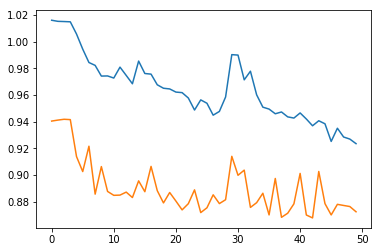

In [25]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

### train model (2da fase)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 2015, 160)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 2011, 32)          25632     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_1 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_2 (KMaxPooling (None, 672, 64)           0         
__________

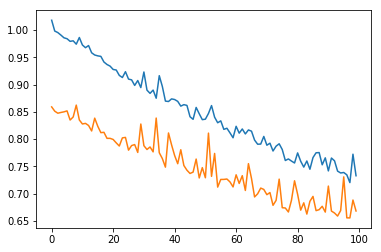

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,24.068198,0.068790,24.431989,2.147769,168.218821,256.556532,0.009985,19.900548,0.068767,0.044772,1.906671,413.141554,0.256945,0.138563,65.068565
MApE,341.742328,47.871307,13.906336,2.576265,351.320826,40.058467,41.669763,129.313033,15.592666,27.043681,535.485186,8.120186,26.701704,16.825520,114.159091
MSE,1965.461735,0.010522,1715.976108,13.267314,77785.389688,117907.451822,0.000684,1052.827328,0.007856,0.003716,13.799881,319435.107266,0.154688,0.033921,37134.963752
MeAE,13.329399,0.043601,17.863566,1.606028,109.326935,202.000183,0.006033,12.424330,0.055860,0.031805,1.195655,323.195801,0.192619,0.108638,48.670032
RMSLE,1.259632,0.081233,0.199354,0.046138,1.324912,0.432176,0.022583,0.924554,0.060303,0.050299,0.678550,0.113256,0.162073,0.096868,0.389424


{'MAE': [24.06819767640887,
  0.06879030255883992,
  24.431989228113395,
  2.1477690000628478,
  168.21882070409188,
  256.55653227248996,
  0.0099853109666174,
  19.90054819779821,
  0.06876700281058208,
  0.0447720615509713,
  1.9066706453786146,
  413.14155418471535,
  0.2569449839223729,
  0.1385633923185934,
  65.06856464022766],
 'MApE': [341.74232827554147,
  47.87130728166158,
  13.906335600784988,
  2.5762647688250864,
  351.32082618522765,
  40.05846721505464,
  41.669762637396296,
  129.31303347594385,
  15.59266563058789,
  27.043680724599845,
  535.4851860629792,
  8.120186006132874,
  26.701704287014707,
  16.825519696308458,
  114.15909056057562],
 'MSE': [1965.4617351231557,
  0.01052214990518708,
  1715.976108214993,
  13.267313754068693,
  77785.38968771519,
  117907.4518218241,
  0.0006835514907812776,
  1052.8273275657061,
  0.007855773134917903,
  0.003716076774813984,
  13.799880750577938,
  319435.10726636706,
  0.1546882693966571,
  0.03392098216761644,
  37134.

In [20]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #t simple

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 2011, 32)          40992     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_1 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_2 (KMaxPooling (None, 672, 64)           0         
__________

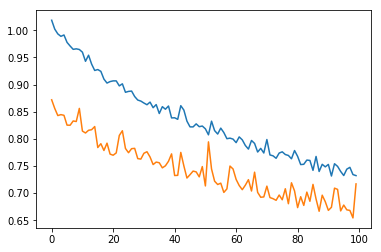

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,25.407045,0.073686,27.196843,2.035310,139.975871,245.285751,0.009487,21.504363,0.070251,0.045275,1.838962,428.239263,0.273917,0.139337,63.721097
MApE,392.047207,56.896824,16.054545,2.456650,215.745696,36.606699,41.710935,143.475569,15.308200,28.715352,365.981179,8.627468,28.915748,17.667880,97.872139
MSE,1878.386221,0.010606,1794.629544,11.889884,80866.114097,108920.570986,0.000524,1058.241349,0.008788,0.004178,21.387538,362178.134289,0.166569,0.034900,39766.398534
MeAE,16.150285,0.055785,21.274947,1.474909,65.276184,192.166016,0.006182,15.229916,0.051393,0.029728,0.887413,300.112305,0.209977,0.104531,43.787827
RMSLE,1.342561,0.082261,0.209924,0.043264,1.264126,0.423820,0.020122,0.936497,0.063695,0.053246,0.639404,0.121243,0.168886,0.100567,0.390687


{'MAE': [25.407044899544488,
  0.0736856383433688,
  27.19684325917775,
  2.0353102640586322,
  139.97587131828365,
  245.28575082911124,
  0.009486854001982967,
  21.504363193441144,
  0.07025091993855957,
  0.04527493006498507,
  1.8389616574778442,
  428.2392631304146,
  0.2739174209651381,
  0.13933694017795054,
  63.72109723250009],
 'MApE': [392.0472074971825,
  56.896824356555896,
  16.05454517908654,
  2.45664994353248,
  215.74569624164744,
  36.606698736637895,
  41.71093489831385,
  143.47556865216418,
  15.308200253348831,
  28.715352452591013,
  365.9811789192033,
  8.627468397171524,
  28.915747573307094,
  17.66787950942701,
  97.87213947215494],
 'MSE': [1878.3862214601297,
  0.01060574106385724,
  1794.629543833501,
  11.889883812005115,
  80866.11409709518,
  108920.57098597672,
  0.0005239666266119965,
  1058.2413489432038,
  0.00878795493644527,
  0.004177940601221127,
  21.3875378744439,
  362178.1342892322,
  0.16656940118100286,
  0.0348998395690705,
  39766.3985

In [20]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #t normal

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 2011, 32)          40992     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_1 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_2 (KMaxPooling (None, 672, 64)           0         
__________

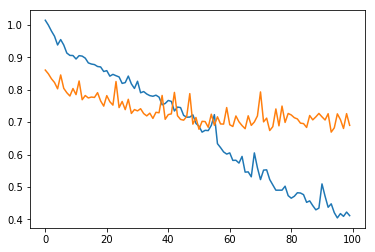

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,25.586467,0.076268,23.398703,2.035562,175.802783,280.664872,0.009438,20.887034,0.072687,0.047158,1.576731,412.008071,0.255557,0.138321,67.325689
MApE,341.427084,52.920840,13.028270,2.401386,327.835871,40.454263,40.814840,125.154950,16.341472,28.076633,309.126972,8.076413,26.670296,16.809863,96.367083
MSE,3245.444270,0.014296,1821.892440,9.791419,101244.776740,154639.900100,0.000656,1506.525555,0.009448,0.004350,14.021793,302177.894589,0.159341,0.033852,40332.890632
MeAE,11.778252,0.048809,14.498674,1.310999,90.417419,214.226746,0.006035,11.660737,0.055334,0.032183,0.835577,325.993164,0.182568,0.105877,47.939455
RMSLE,1.267235,0.090301,0.203459,0.036946,1.725804,0.457760,0.021835,0.921495,0.066020,0.054305,0.585783,0.109135,0.161257,0.096202,0.414110


{'MAE': [25.586467152107833,
  0.07626827913279265,
  23.39870346033609,
  2.0355618032323246,
  175.80278266991425,
  280.6648718352365,
  0.009437649156212218,
  20.88703441627002,
  0.0726872877069039,
  0.04715779789444244,
  1.5767312893106404,
  412.00807066058167,
  0.25555680337282694,
  0.13832052213555515,
  67.32568940188487],
 'MApE': [341.42708369595624,
  52.9208403161429,
  13.028270261182712,
  2.401386191990896,
  327.835871423679,
  40.45426313291706,
  40.81483991822646,
  125.1549503381835,
  16.34147221410843,
  28.076632626972586,
  309.1269723839513,
  8.076412980177738,
  26.670296224391443,
  16.80986341348199,
  96.36708250866874],
 'MSE': [3245.444269633055,
  0.014295662503593333,
  1821.892439832574,
  9.791418625192785,
  101244.77673980786,
  154639.9001002017,
  0.0006558895108055426,
  1506.5255546581507,
  0.009447962896392582,
  0.0043497806381258995,
  14.021793365211137,
  302177.8945894031,
  0.159341347081091,
  0.03385214509170219,
  40332.890632

In [26]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #t normal-- t plus

In [ ]:
# en 50 epochs..
Trainable params: 209,294

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
conv1d_19 (Conv1D)           (None, 2011, 128)         163968    
_________________________________________________________________
conv1d_20 (Conv1D)           (None, 2007, 128)         82048     
_________________________________________________________________
k_max_pooling_10 (KMaxPoolin (None, 1008, 128)         0         
_________________________________________________________________
conv1d_21 (Conv1D)           (None, 1004, 128)         82048     
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 1000, 128)         82048     
_________________________________________________________________
k_max_pooling_11 (KMaxPoolin (None, 80, 128)           0         
__________

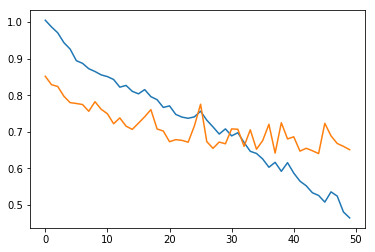

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,22.946139,0.062379,23.936374,1.924057,153.670134,252.270724,0.009440,19.848812,0.068418,0.045267,1.933972,412.042407,0.238744,0.137122,63.509571
MApE,300.418307,43.104713,13.468477,2.298153,274.377934,35.207333,38.215128,126.530631,15.997241,25.884904,503.592994,7.962113,25.376012,16.412265,102.060443
MSE,1889.378130,0.009971,1845.787370,10.932921,74789.294108,113477.921739,0.000654,987.746826,0.007487,0.003664,16.152154,314366.346021,0.151652,0.034430,36241.697652
MeAE,12.220773,0.035861,15.575694,1.100961,86.640137,204.878784,0.005573,12.883187,0.056306,0.034394,1.203279,291.042969,0.165977,0.108992,44.710920
RMSLE,1.204977,0.078454,0.208519,0.040470,1.420898,0.414972,0.021535,0.852703,0.059145,0.049773,0.661340,0.111493,0.160983,0.098213,0.384534


{'MAE': [22.946138946346892,
  0.06237871730531009,
  23.93637398685025,
  1.9240568297735532,
  153.6701336622238,
  252.27072367148824,
  0.0094395049538574,
  19.848811720708337,
  0.0684183721438493,
  0.04526725402173429,
  1.9339716874457502,
  412.0424074682859,
  0.238743556287029,
  0.13712203229252654,
  63.509570529294784],
 'MApE': [300.41830703100095,
  43.104713426400004,
  13.468476807561789,
  2.2981527701685307,
  274.3779341690244,
  35.20733324376652,
  38.21512807474415,
  126.53063119740078,
  15.997241137267764,
  25.884904297090923,
  503.5929935697954,
  7.9621127195996,
  25.376011554671436,
  16.412264836353163,
  102.06044320248897],
 'MSE': [1889.3781301045904,
  0.009971497434543435,
  1845.78736978304,
  10.932921283688108,
  74789.29410791292,
  113477.92173942305,
  0.0006540532224068833,
  987.7468259637544,
  0.007487383596539354,
  0.0036640311175922297,
  16.15215380252545,
  314366.34602108935,
  0.1516515623417675,
  0.03443031443987296,
  36241.69

In [37]:
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 128, L=2,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid', fixed=True) #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=50, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #t normal-- t plus

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        (None, 2015, 256)         0         
_________________________________________________________________
conv1d_29 (Conv1D)           (None, 2011, 32)          40992     
_________________________________________________________________
conv1d_30 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
dropout_12 (Dropout)         (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_4 (Average (None, 669, 32)           0         
_________________________________________________________________
conv1d_31 (Conv1D)           (None, 665, 64)           10304     
_________________________________________________________________
conv1d_32 (Conv1D)           (None, 661, 64)           20544     
__________

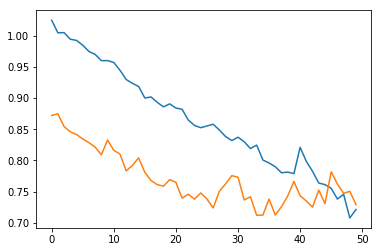

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,21.058037,0.067830,25.117654,1.879064,149.254308,258.997934,0.009523,19.048186,0.071259,0.046451,2.001116,444.464065,0.254898,0.145235,65.886826
MApE,227.545433,43.654943,14.522485,2.232292,285.389358,37.537553,45.282692,113.074339,16.544237,27.741187,775.880391,8.529541,25.309468,17.002031,117.160425
MSE,1944.079215,0.010974,1709.000843,8.478655,71837.088940,148804.887157,0.000442,1042.699895,0.008462,0.003828,13.382702,353501.372743,0.237614,0.044541,41347.235429
MeAE,9.666570,0.043345,18.695568,1.395351,97.277283,200.420227,0.006437,11.608004,0.059916,0.035727,1.331200,363.816895,0.159389,0.106859,50.330198
RMSLE,1.117058,0.082298,0.199498,0.034777,1.255838,0.422977,0.018670,0.824034,0.063312,0.050988,0.700985,0.114979,0.175781,0.104887,0.369006


{'MAE': [21.058036796026325,
  0.06783011870062154,
  25.117653957829905,
  1.8790640968851522,
  149.2543078619655,
  258.9979342923306,
  0.00952296803733795,
  19.048185589554286,
  0.07125936088868888,
  0.04645100257561939,
  2.0011157545712916,
  444.4640654006807,
  0.2548976918272453,
  0.14523455899965645,
  65.88682567506235],
 'MApE': [227.54543271717424,
  43.65494293650685,
  14.522485449355488,
  2.23229193725125,
  285.38935787159227,
  37.537552676532464,
  45.28269180789167,
  113.07433941352582,
  16.544236794396802,
  27.741187150175996,
  775.8803913197434,
  8.52954073409616,
  25.309467950038183,
  17.00203102407848,
  117.16042498445422],
 'MSE': [1944.079214516189,
  0.010973849389429333,
  1709.0008425260587,
  8.478654922255643,
  71837.08894010243,
  148804.8871569069,
  0.00044249623140699086,
  1042.6998951575931,
  0.00846223088415584,
  0.003828147945684663,
  13.382701840647018,
  353501.3727433493,
  0.23761442756508658,
  0.044540892291493196,
  41347.

In [39]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,  #fixed tru and 128
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1,fixed=False )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=50, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #t normal-- t plus

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        (None, 2015, 256)         0         
_________________________________________________________________
conv1d_35 (Conv1D)           (None, 2011, 128)         163968    
_________________________________________________________________
conv1d_36 (Conv1D)           (None, 2007, 128)         82048     
_________________________________________________________________
dropout_16 (Dropout)         (None, 2007, 128)         0         
_________________________________________________________________
average_pooling1d_7 (Average (None, 669, 128)          0         
_________________________________________________________________
conv1d_37 (Conv1D)           (None, 665, 128)          82048     
_________________________________________________________________
conv1d_38 (Conv1D)           (None, 661, 128)          82048     
__________

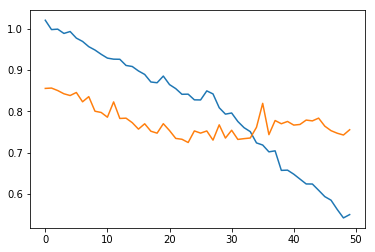

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,22.645488,0.073095,24.782772,1.952563,175.347355,276.360334,0.009354,19.302026,0.070853,0.045432,2.032033,461.579987,0.260080,0.147961,70.329238
MApE,231.591445,48.744242,14.020071,2.319895,343.725977,40.871004,41.483569,112.692085,16.395879,26.719910,788.475086,9.040048,25.054183,17.155692,122.734935
MSE,2184.163811,0.014411,1785.110545,9.226349,103586.611557,134440.945092,0.000493,1142.602170,0.008537,0.003683,31.149528,704384.447383,0.191404,0.054844,67683.180701
MeAE,9.444341,0.042245,16.938786,1.203528,95.203745,217.154907,0.006134,9.616790,0.058444,0.034301,1.020813,331.017090,0.185493,0.112760,48.717098
RMSLE,1.232872,0.087737,0.204118,0.036639,1.386433,0.457486,0.019695,0.872074,0.062190,0.049972,0.692271,0.392667,0.172329,0.105284,0.412269


{'MAE': [22.64548788080739,
  0.0730954036151993,
  24.78277208379293,
  1.9525628172619505,
  175.3473550512354,
  276.36033373539993,
  0.009353858906768335,
  19.30202632489818,
  0.07085334571139648,
  0.045431967735113474,
  2.032032714161,
  461.57998675355816,
  0.26008027614130835,
  0.14796138687558694,
  70.32923811429288],
 'MApE': [231.591444977305,
  48.744242494674914,
  14.020071119038072,
  2.3198950037240946,
  343.7259766502628,
  40.87100365119902,
  41.483569375605136,
  112.69208541009053,
  16.395878687236543,
  26.719910114508366,
  788.4750864350628,
  9.040048021378167,
  25.0541826146095,
  17.15569189487076,
  122.73493474639757],
 'MSE': [2184.1638106774935,
  0.014411254336637482,
  1785.1105452088223,
  9.226348978662408,
  103586.61155691574,
  134440.9450920258,
  0.0004926165165267888,
  1142.6021698769302,
  0.008537042514749234,
  0.003682747988933817,
  31.14952831044734,
  704384.4473828924,
  0.19140398540551662,
  0.0548444706884571,
  67683.18070

In [40]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 128, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1,fixed=True )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=50, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #t normal-- t plus

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 2011, 32)          40992     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
dropout_1 (Dropout)          (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_1 (Average (None, 669, 32)           0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 665, 64)           10304     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 661, 64)           20544     
__________

2841/2841 [==============================] - 25s 9ms/step - loss: 0.8182 - val_loss: 0.7651
Epoch 55/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.8123 - val_loss: 0.7641
Epoch 56/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.8039 - val_loss: 0.7707
Epoch 57/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.8027 - val_loss: 0.7921
Epoch 58/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.8086 - val_loss: 0.7681
Epoch 59/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.7985 - val_loss: 0.7834
Epoch 60/100
2841/2841 [==============================] - 26s 9ms/step - loss: 0.8025 - val_loss: 0.7655
Epoch 61/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.7940 - val_loss: 0.7650
Epoch 62/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.8046 - val_loss: 0.8216
Epoch 63/100
2841/2841 [==============================] - 24s 9ms/st

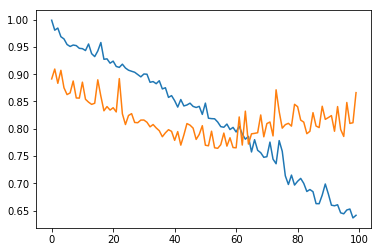

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,28.781167,1.837432,25.791784,1.966460,0.097621,0.009476,245.940759,154.228109,0.072840,0.047165,45.877281
MApE,371.241843,53.882362,14.934300,2.375295,119.654220,40.758647,36.745852,304.649965,16.663362,28.466901,98.937275
MSE,2558.124232,7.477368,1896.317061,11.477181,0.023192,0.000562,113114.453456,78536.336270,0.008565,0.003933,19612.422182
MeAE,14.390278,1.181584,16.243730,1.305883,0.054887,0.005685,183.424561,86.025101,0.060978,0.036261,30.272895
RMSLE,1.286642,0.437000,0.210378,0.042482,0.117177,0.020796,0.422584,1.406785,0.063028,0.051747,0.405862


{'MAE': [28.78116663454282,
  1.8374323240214057,
  25.79178410419052,
  1.9664596176902844,
  0.09762054698014318,
  0.009475539203696322,
  245.94075902051264,
  154.22810935206934,
  0.07283986336122644,
  0.047165468681920876,
  45.877281247125396],
 'MApE': [371.2418429002665,
  53.88236235477489,
  14.934299636031561,
  2.3752952834972096,
  119.65422028982611,
  40.75864665308808,
  36.745852341209066,
  304.64996466551816,
  16.66336166700237,
  28.466900950686323,
  98.93727467419004],
 'MSE': [2558.1242315107324,
  7.477367605607378,
  1896.3170607323918,
  11.477180913524176,
  0.023192428925176613,
  0.0005621059157816736,
  113114.45345590022,
  78536.33626966091,
  0.008565171288888803,
  0.003932844102440812,
  19612.422181887363],
 'MeAE': [14.390277585151367,
  1.181584369659424,
  16.243729716796878,
  1.305882873535154,
  0.054886608839035025,
  0.005685215935111048,
  183.424560546875,
  86.02510070800781,
  0.06097788953781125,
  0.03626062524318696,
  30.272894613

In [48]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 2011, 32)          40992     
_________________________________________________________________
conv1d_8 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_1 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_9 (Conv1D)            (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_10 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_2 (KMaxPooling (None, 672, 64)           0         
__________

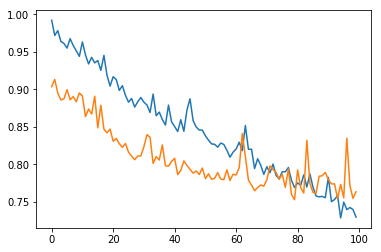

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,20.366169,1.451123,22.892603,2.047496,0.072446,0.009801,234.753959,146.287577,0.073840,0.048332,42.800335
MApE,254.962416,37.437548,13.164871,2.466265,84.959630,44.155048,34.527080,259.404066,17.409535,27.798645,77.628510
MSE,1718.966193,5.955498,1579.276249,11.748663,0.015687,0.000565,103798.905321,71213.106919,0.008164,0.003828,17832.798709
MeAE,10.916418,0.760887,16.215533,1.473417,0.043088,0.006344,184.131836,81.991600,0.065224,0.039488,29.564384
RMSLE,1.110839,0.386748,0.188981,0.043106,0.096261,0.020790,0.400159,1.226758,0.061815,0.050903,0.358636


{'MAE': [20.366168916016505,
  1.4511231210953741,
  22.892602534761757,
  2.0474955534982207,
  0.07244640842391786,
  0.009801005961000921,
  234.75395918742265,
  146.2875771588618,
  0.07383995274505993,
  0.04833160764156002,
  42.80033454464279],
 'MApE': [254.96241580055732,
  37.43754781755428,
  13.164871420848245,
  2.466264899830978,
  84.95963022075232,
  44.155047651167614,
  34.527080335050954,
  259.4040661860825,
  17.409534909262213,
  27.798645374882962,
  77.62851046159894],
 'MSE': [1718.9661932138154,
  5.955498292359785,
  1579.276249042718,
  11.748662993426464,
  0.01568716806975006,
  0.0005648189135875265,
  103798.90532140144,
  71213.10691906225,
  0.0081641526149664,
  0.0038279137488562106,
  17832.798708805938],
 'MeAE': [10.916418059667969,
  0.7608870628356934,
  16.2155331298828,
  1.4734167480468727,
  0.04308825677633285,
  0.0063443988561630235,
  184.1318359375,
  81.9916000366211,
  0.06522386956214904,
  0.03948759520053863,
  29.564383509494956]

In [51]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 2015, 160)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 2011, 16)          12816     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2007, 16)          1296      
_________________________________________________________________
k_max_pooling_1 (KMaxPooling (None, 1344, 16)          0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 1340, 32)          2592      
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 1336, 32)          5152      
_________________________________________________________________
k_max_pooling_2 (KMaxPooling (None, 672, 32)           0         
__________

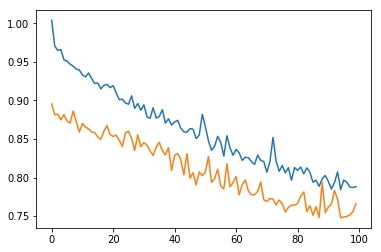

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,23.115219,1.608364,24.477457,2.013401,0.081578,0.009866,244.777772,161.164329,0.072683,0.047533,45.736820
MApE,314.673689,43.322535,14.141510,2.433870,102.364139,40.574924,35.849013,346.595176,17.228352,27.127921,94.431113
MSE,1778.205206,6.171771,1759.790765,13.445500,0.017152,0.000744,111548.924451,79894.576393,0.008002,0.003741,19500.114372
MeAE,13.398908,1.000165,17.099125,1.398327,0.052595,0.005793,182.964294,98.456573,0.063678,0.039834,31.447929
RMSLE,1.189927,0.402582,0.202562,0.046850,0.101740,0.023255,0.418805,1.342644,0.061291,0.050284,0.383994


{'MAE': [23.115219388959154,
  1.6083635143900579,
  24.477457020809673,
  2.0134006118019023,
  0.08157753390789327,
  0.009866372753797781,
  244.77777172126392,
  161.16432868655366,
  0.07268280849598423,
  0.04753301210167385,
  45.73682006710377],
 'MApE': [314.673688944959,
  43.3225350327949,
  14.141509825550783,
  2.4338695344140766,
  102.36413909597823,
  40.57492394075011,
  35.84901288325669,
  346.5951755987961,
  17.22835245576128,
  27.12792059031909,
  94.43111279025803],
 'MSE': [1778.2052061142133,
  6.171770874672727,
  1759.7907650798763,
  13.445500464481109,
  0.017151813020746552,
  0.0007435568210969515,
  111548.92445070707,
  79894.57639260581,
  0.00800234187736779,
  0.003740911146456538,
  19500.114372446897],
 'MeAE': [13.398908369970703,
  1.0001651725769047,
  17.09912453222657,
  1.3983273315429727,
  0.05259541940689086,
  0.005792788788676263,
  182.96429443359375,
  98.45657348632812,
  0.06367771100997932,
  0.039834181904792765,
  31.447929342734

In [23]:
#version 2
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 16, L=3,
                        kernel_s =5, K_top=100, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

In [21]:
X_train.shape

(3552, 2015, 256)

In [29]:
256/2

128.0

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           (None, 2015, 132)    0                                            
__________________________________________________________________________________________________
input_10 (InputLayer)           (None, 2015, 124)    0                                            
__________________________________________________________________________________________________
conv1d_61 (Conv1D)              (None, 2011, 32)     21152       input_11[0][0]                   
__________________________________________________________________________________________________
conv1d_55 (Conv1D)              (None, 2011, 32)     19872       input_10[0][0]                   
__________________________________________________________________________________________________
conv1d_62 

Epoch 30/50
2841/2841 [==============================] - 57s 20ms/step - loss: 0.8818 - val_loss: 0.7643
Epoch 31/50
2841/2841 [==============================] - 57s 20ms/step - loss: 0.8661 - val_loss: 0.7587
Epoch 32/50
2841/2841 [==============================] - 56s 20ms/step - loss: 0.8850 - val_loss: 0.7608
Epoch 33/50
2841/2841 [==============================] - 58s 20ms/step - loss: 0.8724 - val_loss: 0.7842
Epoch 34/50
2841/2841 [==============================] - 57s 20ms/step - loss: 0.8638 - val_loss: 0.7550
Epoch 35/50
2841/2841 [==============================] - 57s 20ms/step - loss: 0.8774 - val_loss: 0.7816
Epoch 36/50
2841/2841 [==============================] - 57s 20ms/step - loss: 0.8698 - val_loss: 0.7674
Epoch 37/50
2841/2841 [==============================] - 57s 20ms/step - loss: 0.8682 - val_loss: 0.7406
Epoch 38/50
2841/2841 [==============================] - 57s 20ms/step - loss: 0.8721 - val_loss: 0.7575
Epoch 39/50
2841/2841 [==============================] 

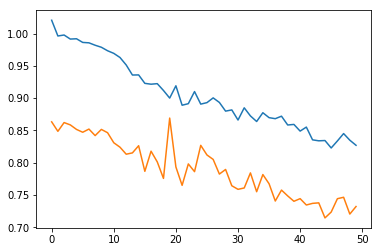

ValueError: Error when checking model : the list of Numpy arrays that you are passing to your model is not the size the model expected. Expected to see 2 array(s), but instead got the following list of 1 arrays: [array([[[3.83736640e-02, 7.27477372e-02, 8.34544376e-02, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [1.44874817e-02, 7.83519149e-02, 6.09973595e-02, ...,
         0.000000...

In [28]:
#seprar X en lc y time..
X_train_tim =X_train[:,:,128:]
X_train_lc = X_train[:,:,:128]

model_kpool_time = build_kpool_model(X_train_tim.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool_time.pop()
model_kpool_time.pop()
model_kpool_time.pop()
model_kpool_lc = build_kpool_model(X_train_lc.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool_lc.pop()
model_kpool_lc.pop()
model_kpool_lc.pop()

out = Concatenate()([model_kpool_lc.output, model_kpool_time.output])

fout = GRU(64, return_sequences=False)(out)
fout = Dense(Y_train.shape[1], activation='linear')(fout)
final_model_k = Model(inputs=[model_kpool_time.input, model_kpool_lc.input], outputs=fout)

final_model_k.compile(loss='mse', optimizer='adam')
final_model_k.summary()

hist = train_model(final_model_k, [X_train_tim,X_train_lc], Ystd_train, epochs=50, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()


Y_test_hat = final_model_k.predict([X_test[:,:,128:],X_test[:,:,:128]]) #128
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

In [45]:
%%time
Y_train_hat = model_simple.predict(X_train, batch_size=1024)
Y_test_hat = model_simple.predict(X_test, batch_size=1024)

CPU times: user 13.6 s, sys: 3.5 s, total: 17.1 s
Wall time: 6.24 s


In [25]:
%%time
model = model_kpool
Y_train_hat = model.predict(X_train, batch_size=1024)
Y_test_hat = model.predict(X_test, batch_size=1024)

CPU times: user 2min 26s, sys: 19 s, total: 2min 45s
Wall time: 10.8 s


## Evaluate

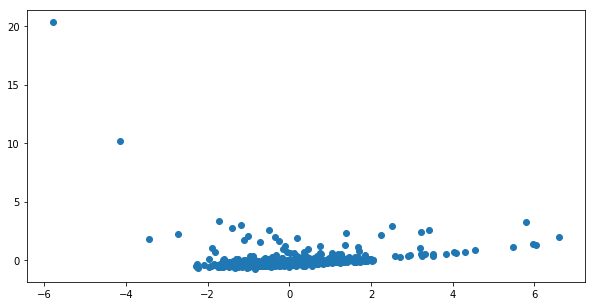

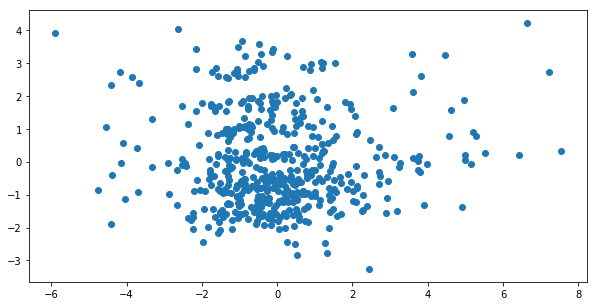

In [42]:
from sklearn.decomposition import PCA
aux_model = PCA(2)
plot_enc = aux_model.fit_transform(Y_test_hat)

plt.figure(figsize=(10,5))
plt.scatter(plot_enc[:,0],plot_enc[:,1])
plt.show()

aux_model = PCA(2)
plot_enc = aux_model.fit_transform(Ystd_test)

plt.figure(figsize=(10,5))
plt.scatter(plot_enc[:,0],plot_enc[:,1])
plt.show()

In [26]:
from IPython.display import display, HTML
from evaluation import evaluate_metadata, evaluate_metadata_raw

def plot_n_meta(real, pred, n= 10, plot_real = True):
    if plot_real:
        pred = scaler_meta.inverse_transform(pred)
    for _ in range(n):
        n_sampled = np.random.randint(0,real.shape[0])
        aux = pd.DataFrame()
        aux["Real"] = real[n_sampled]
        aux["Predicted"] = pred[n_sampled]
        aux.index=metadata_used
        display(aux.transpose())
        print("----------------------------------------------------------------")

    
### deprecated
def evaluate_meta(real, pred, scaler_meta, plot=True):
    res_metadata = {}
    inv_real = scaler_meta.inverse_transform(real)
    inv_pred = scaler_meta.inverse_transform(pred)
    
    res = evaluate_metadata(real,pred)
    res_true = evaluate_metadata(inv_real,inv_pred)
    
    res_metadata = {key: [value, res[key]] for key,value in res_true.items() }    
    if plot:
        df = pd.DataFrame(res_metadata)
        df.index = ["Real","Scaled"]
        print(df)
    return res_metadata

In [35]:
###  plot some examples..
print("Train")
plot_n_meta(Y_train, Y_train_hat)
print("Test")
plot_n_meta(Y_test, Y_test_hat)

Train


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,35.968269,2.83900,138.66885,88.97000,0.227000,0.018000,674.000000,40.000000,0.367000,0.286000
Predicted,32.837322,4.72735,156.17514,87.61293,0.164976,0.016041,835.386597,188.780365,0.407819,0.255353


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,1.646802,1.196600,132.061500,89.300000,0.022000,0.015000,806.000000,807.000000,0.316000,0.387000
Predicted,18.373137,2.159765,137.171021,85.320435,0.061263,0.017204,1116.647705,699.628479,0.516683,0.196814


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,14.887767,4.981000,141.95432,86.850000,0.119000,0.01600,831.00000,91.000000,0.315000,0.303000
Predicted,38.168129,5.400047,150.74527,88.219292,0.190438,0.01334,780.83252,121.623024,0.402252,0.261673


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,25.762685,6.908000,147.696300,89.320000,0.171000,0.023000,633.00000,47.00000,0.410000,0.260000
Predicted,66.930138,6.885375,179.079971,89.091835,0.281068,0.025438,607.36731,47.25045,0.400495,0.263634


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,1.118548,1.553400,132.848260,87.680000,0.019000,0.01400,1174.000000,1192.000000,0.685000,0.066000
Predicted,19.149321,4.120082,139.248062,86.940559,0.113646,0.01367,963.416992,328.233307,0.415272,0.256143


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,8.506981,2.938000,134.644210,86.530000,0.08000,0.018000,900.000000,160.00000,0.393000,0.268000
Predicted,23.100954,4.131449,143.688126,87.590782,0.12312,0.014855,888.516846,234.33136,0.404807,0.258538


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,34.211502,4.947000,154.575080,89.960000,0.189000,0.015000,427.000000,39.000000,0.557000,0.16100
Predicted,60.729019,4.713846,165.412384,88.438232,0.255712,0.020464,599.412781,143.990051,0.490832,0.20687


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,0.693843,1.619700,132.181570,86.590000,0.015000,0.006000,2161.000000,1930.000000,0.455000,0.233000
Predicted,-13.999569,1.414462,132.474777,83.930351,0.002583,0.013212,1408.998413,1060.396362,0.496514,0.203435


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,20.264202,4.664000,135.279190,86.420000,0.149000,0.015000,770.000000,51.000000,0.366000,0.284000
Predicted,45.664730,5.890095,172.176743,88.855209,0.219155,0.022689,674.379211,74.135597,0.396745,0.265082


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,36.292017,8.19800,132.176910,90.000000,0.223000,0.018000,694.000000,36.000000,0.405000,0.264000
Predicted,15.388481,3.97101,144.371063,85.924698,0.104504,0.016489,1074.228271,469.598633,0.429813,0.247873


----------------------------------------------------------------
Test


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,13.722368,5.123100,137.84083,89.980000,0.105000,0.022000,746.000000,97.000000,0.37300,0.279000
Predicted,8.599157,5.093306,164.02800,89.032402,0.107747,0.029436,702.213806,141.968903,0.39482,0.280912


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,1.855558,2.356720,137.181028,84.470000,0.029000,0.097000,1436.000000,725.000000,0.393000,0.268000
Predicted,13.342141,2.507035,151.040009,89.250885,0.045111,0.050715,1417.306152,586.108887,0.398918,0.245121


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,11.008176,2.013000,143.226110,89.970000,0.0820,0.034000,488.00000,125.000000,0.644000,0.101000
Predicted,14.440279,2.253772,148.765884,86.746582,0.0801,0.018697,927.16156,497.826233,0.482159,0.219235


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,44.964075,4.981000,144.56002,89.910000,0.2300,0.025000,379.000000,30.000000,0.632000,0.105000
Predicted,50.978561,4.764045,173.82724,90.089989,0.2548,0.041799,545.421265,108.599762,0.412916,0.261538


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,10.712535,2.718600,137.164990,88.160000,0.078000,0.034000,485.000000,105.000000,0.574000,0.150000
Predicted,17.078119,3.737796,147.480118,87.216583,0.104427,0.018169,950.515808,244.080963,0.422406,0.247769


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,6.098556,2.981500,135.929060,89.220000,0.063000,0.008000,927.000000,196.000000,0.453000,0.233000
Predicted,12.949014,3.030324,158.476089,88.774986,0.098479,0.024134,672.663574,113.753166,0.476994,0.225329


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,2.553150,1.84900,132.448490,88.190000,0.037000,0.013000,1312.000000,448.00000,0.345000,0.292000
Predicted,67.403053,6.74118,177.730606,89.123703,0.277282,0.024538,625.071472,57.38456,0.397075,0.265404


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,5.700706,1.640800,132.69229,88.15000,0.064000,0.019000,1035.000000,221.00000,0.366000,0.284000
Predicted,24.271538,4.777128,148.87764,88.16011,0.146759,0.017119,862.380859,152.46492,0.396859,0.261537


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,19.986592,4.391000,135.522650,85.750000,0.140000,0.031000,720.000000,68.000000,0.455000,0.233000
Predicted,17.276369,3.830859,140.285553,87.250336,0.106409,0.014524,944.383179,303.552277,0.416118,0.253695


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,43.034336,6.571000,137.690070,88.070000,0.233000,0.025000,484.000000,27.000000,0.453000,0.233000
Predicted,45.768337,5.363133,176.420486,89.455696,0.221241,0.028321,543.612549,30.319876,0.441317,0.234996


----------------------------------------------------------------


In [27]:
###  plot some examples..
print("Train")
plot_n_meta(Y_train, Y_train_hat)
print("Test")
plot_n_meta(Y_test, Y_test_hat)

Train


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,4.176343,2.335000,352.996740,89.410000,202.000000,694.000000,0.020000,0.043000,13.82000,0.574000,0.150000,2.861730,4362.000000,4.722000,-0.500000,0.554000,0.590000
Predicted,13.982543,2.296064,194.821136,86.571365,472.735626,755.479492,0.032763,0.068475,30.01503,0.504675,0.218397,10.454402,4162.175293,4.703132,-0.114382,0.633509,0.606581


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,3.773599,2.728200,134.070130,90.000000,290.000000,1270.000000,0.012000,0.045000,10.712000,0.303000,0.303000,1.632870,6224.000000,4.404000,-0.720000,0.969000,0.868000
Predicted,27.593994,5.247592,157.729645,87.090469,124.451927,872.729492,0.017746,0.153796,24.805248,0.388402,0.271327,0.926587,5867.783203,4.314521,-0.021853,1.271149,1.041161


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,1.260259,1.859400,170.408984,77.170000,1056.000000,1569.00000,0.03400,0.023000,3.56000,0.495000,0.211000,0.537780,5550.000000,4.500000,0.460000,0.954000,1.050000
Predicted,22.027388,3.157895,145.076065,86.860313,413.328186,963.76886,0.01732,0.107897,27.39514,0.464309,0.223802,3.413482,5312.723633,4.462177,-0.035946,0.944312,0.881662


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,91.940125,9.19500,134.300000,89.980000,12.000000,450.000000,0.020000,0.410000,77.890000,0.366000,0.28400,1.057590,5970.00000,4.317000,0.10000,1.200000,1.089000
Predicted,61.297562,7.30679,174.150375,88.662926,27.765005,632.809021,0.024599,0.274984,49.566269,0.386811,0.27358,0.516274,5896.35498,4.302121,-0.01768,1.362129,1.056015


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,31.003307,5.253000,143.29085,89.81000,41.000000,616.000000,0.023000,0.204000,45.630000,0.37300,0.283000,1.870350,6090.000000,4.447000,0.210000,1.071000,1.173000
Predicted,61.336296,6.851561,159.05925,88.31794,137.692337,725.740112,0.020435,0.259031,47.908661,0.39509,0.269476,1.386149,5825.232422,4.317551,-0.011872,1.283702,1.039544


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,14.589324,2.418400,141.93498,88.860000,94.000000,594.000000,0.02800,0.110000,35.000000,0.49700,0.204000,3.795000,5142.000000,4.602000,-0.060000,0.755000,0.84000
Predicted,26.174200,3.234696,148.92807,88.038216,222.726166,727.324585,0.02043,0.144634,37.489918,0.47843,0.220164,3.607402,5195.240723,4.505501,-0.039626,0.837197,0.84298


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,7.825022,2.186000,136.549950,87.990000,154.000000,494.000000,0.022000,0.061000,20.200000,0.236000,0.417000,2.54508,3950.000000,4.75400,-0.460000,0.493000,0.502000
Predicted,38.900639,5.783744,155.023132,87.741005,119.478561,790.262512,0.019326,0.192528,34.654251,0.392187,0.269687,0.88810,5817.185547,4.31574,-0.016144,1.285936,1.038399


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,9.590686,3.452000,132.682640,88.990000,113.000000,1087.000000,0.022000,0.083000,20.310000,0.398000,0.265000,1.723430,5476.00000,3.90400,-0.56000,1.673000,0.819000
Predicted,22.110247,4.079551,156.967163,87.885841,138.953964,863.897156,0.020134,0.116016,24.559641,0.441941,0.237558,1.380569,5646.27002,4.40649,-0.04146,1.027249,0.980077


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,36.445400,4.0070,151.601250,89.980000,27.000000,332.000000,0.030000,0.185000,71.530000,0.683000,0.072000,5.212370,4126.000000,4.661000,0.04000,0.615000,0.633000
Predicted,37.881828,4.7358,166.214233,88.051247,109.208473,688.556519,0.022866,0.170029,40.733807,0.448513,0.231484,1.929454,5427.054199,4.420819,-0.08334,0.958894,0.886617


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,16.239471,4.037400,175.569907,89.920000,83.000000,598.000000,0.045000,0.123000,32.100000,0.53200,0.183000,2.371920,5191.000000,4.564000,0.340000,0.837000,0.937000
Predicted,15.583635,4.025393,160.078751,88.558144,142.650681,815.385742,0.028633,0.109053,25.868208,0.45382,0.231602,1.696374,5371.766113,4.452706,0.019546,0.957394,0.906435


----------------------------------------------------------------
Test


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,13.899632,3.579100,182.864454,87.800000,92.000000,521.000000,0.0340,0.098000,20.270000,0.666000,0.077000,0.81571,4538.000000,4.607000,-0.200000,0.663000,0.650000
Predicted,24.967485,3.988107,159.880661,89.264694,123.478775,615.053345,0.0306,0.154959,36.652359,0.499471,0.199895,1.93299,5099.614746,4.472106,0.027761,0.930068,0.853458


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,7.139697,3.981000,137.186520,89.890000,186.000000,965.000000,0.021000,0.075000,13.99000,0.366000,0.284000,1.01680,6014.000000,4.48600,0.070000,0.993000,1.101000
Predicted,54.157120,5.990749,153.554642,88.391586,191.564041,781.244629,0.019362,0.231032,46.48716,0.400436,0.263006,2.00587,5776.017578,4.36041,-0.019388,1.139938,1.009641


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,2.052350,2.077800,169.890622,86.7600,650.00000,1497.000000,0.11100,0.032000,7.743000,0.410000,0.26000,2.085260,5855.00000,4.393000,0.14000,1.080000,1.049000
Predicted,-25.283463,3.292479,105.489960,60.7416,924.00293,1802.177612,0.35213,-0.092691,-11.092329,0.393419,0.28833,7.622647,5758.10791,4.512656,-0.53168,0.664171,0.643991


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,11.634860,5.466000,140.500710,89.820000,110.000000,961.000000,0.015000,0.101000,16.50000,0.464000,0.229000,0.627760,5570.000000,4.066000,0.160000,1.54800,1.019000
Predicted,36.984612,4.774739,149.694763,88.284515,143.715759,779.501831,0.020658,0.181131,39.45499,0.415025,0.254556,1.838248,5749.807617,4.394296,-0.042344,1.04144,0.970841


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,8.222414,2.710000,172.956570,89.390000,126.000000,558.000000,0.034000,0.06800,23.280000,0.666000,0.085000,3.532270,4213.000000,4.658000,-0.100000,0.615000,0.626000
Predicted,4.545066,2.700635,183.501801,88.955139,132.120209,621.475464,0.034804,0.07412,22.319801,0.516798,0.194191,3.193738,4893.340332,4.620976,-0.033399,0.612667,0.750806


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,4.484943,2.75200,135.018360,88.570000,233.000000,1199.000000,0.011000,0.05500,12.030000,0.319000,0.302000,1.637720,6217.000000,4.437000,-0.080000,1.051000,1.100000
Predicted,31.137154,5.38757,151.960388,87.143112,147.177429,889.600708,0.016326,0.15961,27.673359,0.381351,0.274341,0.962514,5913.557617,4.303279,-0.023565,1.210643,1.045103


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,10.940267,2.349400,170.305510,88.850000,123.000000,764.000000,0.022000,0.095000,29.60000,0.39300,0.268000,4.088310,5749.000000,4.547000,-0.100000,0.864000,0.961000
Predicted,38.503738,3.896403,159.848877,86.557098,422.646515,899.777466,0.019307,0.153006,41.81329,0.48294,0.204066,2.769954,5126.350586,4.402038,-0.020457,1.036673,0.856991


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,7.010743,2.178700,138.402700,88.920000,187.000000,1453.000000,0.014000,0.077000,22.600000,0.366000,0.282000,4.451670,5814.000000,3.745000,-0.260000,2.476000,1.243000
Predicted,46.145126,6.120688,151.335495,87.641197,207.125168,870.994385,0.016251,0.204485,35.122547,0.382805,0.273802,1.165839,5900.208496,4.277255,-0.019957,1.321271,1.066527


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,4.754001,2.539400,128.547155,86.540000,278.00000,775.000000,0.026000,0.050000,11.130000,0.627000,0.108000,1.15331,4728.000000,4.628000,0.040000,0.693000,0.768000
Predicted,3.905792,2.695782,168.910858,88.698235,233.55365,780.208435,0.037849,0.061109,19.366247,0.511391,0.198022,1.68742,5058.421387,4.539848,0.076551,0.870527,0.829644


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,Semi-major Axis,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,log(g),Metallicity,Stellar Radius,Stellar Mass
Real,5.263415,2.144600,174.351207,85.550000,252.000000,1103.000000,0.03400,0.061000,11.000000,0.359000,0.287000,0.907640,6099.000000,4.456000,0.020000,1.028000,1.098000
Predicted,13.109890,2.803572,172.716583,88.519691,239.506439,721.746582,0.03426,0.097379,25.768669,0.483284,0.224464,4.308446,4891.932129,4.560924,-0.013689,0.726672,0.794353


----------------------------------------------------------------


#### evaluate by column


In [47]:
print("**********************Train**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_train), scaler_meta.inverse_transform(Y_train_hat),
                     metadata_used=metadata_used)
print("**********************Test**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_test), scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #simple

**********************Train**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,26.088588,1.845112,25.625450,1.975370,0.092487,0.010030,296.498027,175.067259,0.081320,0.052427,52.733607
MApE,384.854635,56.591708,14.805155,2.421405,121.427696,54.305174,44.456601,356.700387,19.574572,29.597479,108.473481
MSE,2797.106885,7.168454,1765.203332,12.271063,0.022293,0.000276,150975.786037,85299.151274,0.009826,0.004481,24085.672392
MeAE,19.040739,1.438271,20.674305,1.577992,0.069533,0.007713,248.884338,134.744781,0.075975,0.045538,42.655919
RMSLE,1.303854,0.436065,0.199142,0.045554,0.111172,0.015261,0.469376,1.360493,0.068171,0.054758,0.406385


**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,25.684939,1.907519,26.369095,2.001954,0.092569,0.010524,265.528939,169.549391,0.080095,0.051072,49.127610
MApE,375.508887,55.798040,15.261105,2.419925,118.987488,53.030047,40.602784,350.228219,18.767344,30.197973,106.080181
MSE,1884.338016,7.031793,1702.262665,11.232531,0.018972,0.000523,119271.200649,80309.053486,0.009510,0.004220,20318.515237
MeAE,19.510680,1.489109,21.174943,1.634955,0.072393,0.007805,227.130920,128.478119,0.073216,0.044210,39.961635
RMSLE,1.298192,0.443539,0.199163,0.042015,0.107227,0.020419,0.438367,1.352654,0.066661,0.053542,0.402178


{'MAE': [25.684939312108984,
  1.9075188277613007,
  26.369094606940358,
  2.0019539897654313,
  0.09256938856953736,
  0.010523705590479444,
  265.5289385200727,
  169.54939124985498,
  0.08009508484141661,
  0.051072467011744435,
  49.127609715251694],
 'MApE': [375.5088872818347,
  55.79804017318509,
  15.261105332294346,
  2.4199245505463525,
  118.9874883251619,
  53.03004661369405,
  40.602783855004795,
  350.2282192220981,
  18.76734352551398,
  30.197973441817577,
  106.0801812321151],
 'MSE': [1884.338015783265,
  7.031793282482175,
  1702.26266499326,
  11.232530828245892,
  0.018972141258775364,
  0.0005230952482412378,
  119271.20064931207,
  80309.05348624308,
  0.009509763482621352,
  0.004219745549775976,
  20318.515236518793],
 'MeAE': [19.510679755756836,
  1.4891092872619627,
  21.174942939453132,
  1.6349551391601551,
  0.07239313924312592,
  0.0078053886890411366,
  227.13092041015625,
  128.47811889648438,
  0.07321555447578432,
  0.04421041452884672,
  39.96163509

In [50]:
print("**********************Train**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_train), scaler_meta.inverse_transform(Y_train_hat),
                     metadata_used=metadata_used)
print("**********************Test**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_test), scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #cnn

**********************Train**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,19.763635,1.324323,21.603371,1.820010,0.065235,0.006994,209.548884,132.087086,0.070552,0.046262,38.633635
MApE,243.232387,41.698815,12.718682,2.222579,84.647856,36.021848,29.663625,185.807128,16.693885,26.489860,67.919667
MSE,1759.585316,4.101074,1372.576626,10.327764,0.011882,0.000130,85872.977066,60001.888792,0.007997,0.003891,14902.148054
MeAE,10.234917,0.879063,14.507827,1.193958,0.040680,0.005326,152.905334,70.459984,0.058771,0.034289,25.032015
RMSLE,1.013586,0.337080,0.177880,0.042032,0.081199,0.010661,0.385173,1.095222,0.061309,0.051023,0.325517


**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,28.781167,1.837432,25.791784,1.966460,0.097621,0.009476,245.940759,154.228109,0.072840,0.047165,45.877281
MApE,371.241843,53.882362,14.934300,2.375295,119.654220,40.758647,36.745852,304.649965,16.663362,28.466901,98.937275
MSE,2558.124232,7.477368,1896.317061,11.477181,0.023192,0.000562,113114.453456,78536.336270,0.008565,0.003933,19612.422182
MeAE,14.390278,1.181584,16.243730,1.305883,0.054887,0.005685,183.424561,86.025101,0.060978,0.036261,30.272895
RMSLE,1.286642,0.437000,0.210378,0.042482,0.117177,0.020796,0.422584,1.406785,0.063028,0.051747,0.405862


{'MAE': [28.78116663454282,
  1.8374323240214057,
  25.79178410419052,
  1.9664596176902844,
  0.09762054698014318,
  0.00947553920369632,
  245.94075902051264,
  154.22810935206934,
  0.07283986336122644,
  0.047165468681920876,
  45.877281247125396],
 'MApE': [371.2418429002665,
  53.882362354774905,
  14.934299636031561,
  2.3752952834972096,
  119.65422028982611,
  40.75864665308808,
  36.74585234120908,
  304.64996466551816,
  16.66336166700237,
  28.46690095068633,
  98.93727467419004],
 'MSE': [2558.1242315107324,
  7.477367605607378,
  1896.317060732392,
  11.477180913524176,
  0.023192428925176613,
  0.0005621059157816735,
  113114.45345590022,
  78536.33626966091,
  0.008565171288888803,
  0.0039328441024408115,
  19612.422181887363],
 'MeAE': [14.390277585151367,
  1.181584369659424,
  16.243729716796878,
  1.305882873535154,
  0.054886608839035025,
  0.005685215935111048,
  183.424560546875,
  86.02510070800781,
  0.06097788953781125,
  0.03626062524318696,
  30.27289461395

In [53]:
print("**********************Train**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_train), scaler_meta.inverse_transform(Y_train_hat),
                     metadata_used=metadata_used)
print("**********************Test**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_test), scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #kmaxpool

**********************Train**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,18.228125,1.258032,22.000837,1.884886,0.064956,0.007668,243.869913,147.524961,0.073559,0.048708,43.496165
MApE,203.207856,34.063924,12.590588,2.303026,76.462129,41.416245,34.846743,256.043992,18.005814,26.366389,70.530670
MSE,2038.327775,4.566058,1559.316576,11.014226,0.014192,0.000146,112647.218299,68648.582981,0.008276,0.004005,18490.905253
MeAE,9.813194,0.727520,15.641718,1.360624,0.040610,0.006091,185.878143,89.176010,0.065107,0.039930,30.274895
RMSLE,0.994310,0.329918,0.183325,0.043233,0.086675,0.011329,0.437787,1.170097,0.062746,0.051532,0.337095


**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,20.366169,1.451123,22.892603,2.047496,0.072446,0.009801,234.753959,146.287577,0.073840,0.048332,42.800335
MApE,254.962416,37.437548,13.164871,2.466265,84.959630,44.155048,34.527080,259.404066,17.409535,27.798645,77.628510
MSE,1718.966193,5.955498,1579.276249,11.748663,0.015687,0.000565,103798.905321,71213.106919,0.008164,0.003828,17832.798709
MeAE,10.916418,0.760887,16.215533,1.473417,0.043088,0.006344,184.131836,81.991600,0.065224,0.039488,29.564384
RMSLE,1.110839,0.386748,0.188981,0.043106,0.096261,0.020790,0.400159,1.226758,0.061815,0.050903,0.358636


{'MAE': [20.366168916016505,
  1.4511231210953741,
  22.892602534761757,
  2.0474955534982207,
  0.07244640842391786,
  0.00980100596100092,
  234.75395918742265,
  146.2875771588618,
  0.07383995274505993,
  0.04833160764156002,
  42.80033454464279],
 'MApE': [254.96241580055732,
  37.43754781755428,
  13.164871420848245,
  2.466264899830978,
  84.95963022075233,
  44.155047651167614,
  34.527080335050954,
  259.40406618608245,
  17.409534909262213,
  27.798645374882962,
  77.62851046159895],
 'MSE': [1718.9661932138154,
  5.955498292359785,
  1579.276249042718,
  11.748662993426464,
  0.015687168069750058,
  0.0005648189135875264,
  103798.90532140144,
  71213.10691906227,
  0.0081641526149664,
  0.0038279137488562106,
  17832.798708805938],
 'MeAE': [10.916418059667969,
  0.7608870628356934,
  16.2155331298828,
  1.4734167480468727,
  0.04308825677633285,
  0.0063443988561630235,
  184.1318359375,
  81.9916000366211,
  0.06522386956214904,
  0.03948759520053863,
  29.564383509494956

In [ ]:
print("**********************Train**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_train), scaler_meta.inverse_transform(Y_train_hat),
                     metadata_used=metadata_used)
print("**********************Test**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_test), scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #kmaxpool -V2

### acc obtain with new encoder rep..

In [36]:
Y_aux_train = scaler_meta.transform(df_meta_obj.values[mask_train])
Y_aux_test  = scaler_meta.transform(df_meta_obj.values[mask_test])

#labels
exop_train = 1*(all_labels=="CONFIRMED")[mask_train].values
exop_test = 1*(all_labels=="CONFIRMED")[mask_test].values

print("Metadata train shape: ",Y_aux_train.shape)
print("Metadata test shape: ", Y_aux_test.shape)
print("Exo-Label train shape: ",exop_train.shape)
print("Exo-Label test shape: ",exop_test.shape)

Metadata train shape:  (4692, 10)
Metadata test shape:  (1565, 10)
Exo-Label train shape:  (4692,)
Exo-Label test shape:  (1565,)


In [37]:
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_validate
from sklearn.metrics import make_scorer, f1_score, recall_score, accuracy_score, precision_score
scorers = {
    'f1_score_we':make_scorer(f1_score,average='weighted'),
    'f1_score_macro':make_scorer(f1_score,average='macro'),
    'f1_score_micro':make_scorer(f1_score,average='micro')
}

from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_jobs=-1, random_state=0)
param_grid = {
    'n_estimators' : [10,20,30,40,50,60,70,80,90,100],
    'min_samples_split': [2,5,10,15,20,25],
    #'max_depth': np.arange(5,25),
    'class_weight' : ['balanced','balanced_subsample',None]
}

skf = StratifiedKFold(n_splits=5)
grid_search = GridSearchCV(clf, param_grid, scoring=scorers, refit='f1_score_we',
                       cv=skf, return_train_score=False, n_jobs=-1)
grid_search.fit(Y_aux_train, exop_train)

print('Best params for completeness:', grid_search.best_params_)
results = pd.DataFrame(grid_search.cv_results_)
bestResults = results[results.params == grid_search.best_params_]
f1_w = float(bestResults['mean_test_f1_score_we'])
print('F1-score weighted: {:.4f}'.format(f1_w))
f1_ma = float(bestResults['mean_test_f1_score_macro'])
print('F1-score macro: {:.4f}'.format(f1_ma))
f1_mi = float(bestResults['mean_test_f1_score_micro'])
print('F1-score micro: {:.4f}'.format(f1_mi))

/users/fmena/anaconda3/envs/tesis/lib/python3.5/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


Best params for completeness: {'min_samples_split': 5, 'n_estimators': 80, 'class_weight': 'balanced_subsample'}
F1-score weighted: 0.9019
F1-score macro: 0.8965
F1-score micro: 0.9013


#### Baseline model (real metadata)

Train


,F1 macro,F1 micro,F1 raw,F1 weighted,Precision raw,Recall raw
False Positive,0.995024,0.995311,0.996220,0.995314,0.998278,0.994170
Confirmed,0.995024,0.995311,0.993827,0.995314,0.990492,0.997185


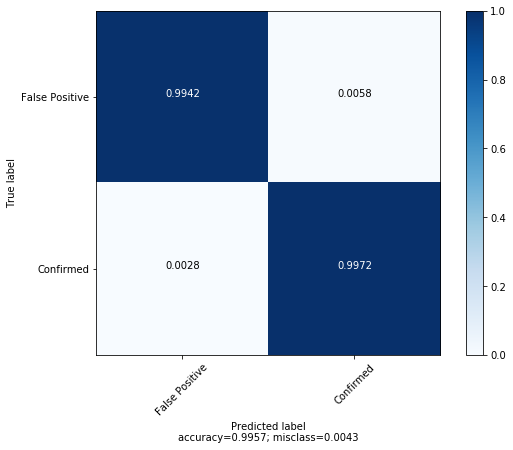

Test


,F1 macro,F1 micro,F1 raw,F1 weighted,Precision raw,Recall raw
False Positive,0.851957,0.86262,0.891688,0.866047,0.956757,0.834906
Confirmed,0.851957,0.86262,0.812227,0.866047,0.726562,0.920792


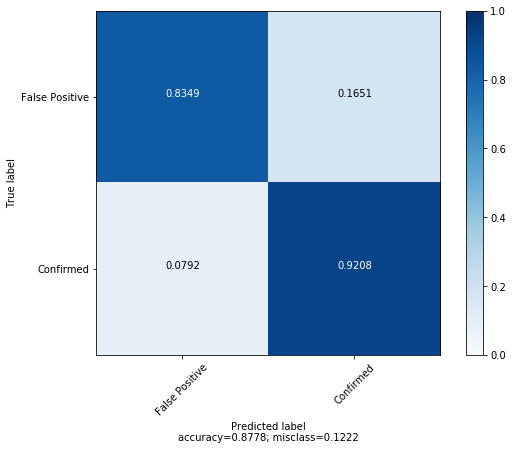

In [38]:
ens_model = RandomForestClassifier(n_jobs=-1, random_state=0, **grid_search.best_params_) 
ens_model.fit(Y_aux_train, exop_train) 

exop_train_pred = ens_model.predict(Y_aux_train)
exop_test_pred = ens_model.predict(Y_aux_test)

print("Train")
aux = calculate_metrics(exop_train, exop_train_pred)
print("Test")
aux = calculate_metrics(exop_test, exop_test_pred) 

#### with Encoder model

In [39]:
time_kepler = np.load(folder_lc+"npy/KOI_LC_time.npy")
process_lc = np.load(folder_lc+'/cleaned/LC_kepler_processed.npy')
N, T = time_kepler.shape
print((N,T))

for i in range(N):
    time_kepler[i], process_lc[i] = generate_representation(time_kepler[i], process_lc[i])

coupled_lc_scaled = []
delta_time = []
for i in range(N):
    mask_nan_aux = np.isnan(process_lc[i])
    lc_i = process_lc[i][~mask_nan_aux]
    time = time_kepler[i][~mask_nan_aux]
    
    std_i = lc_i.std(keepdims=True)
    coupled_lc_scaled.append(lc_i/std_i) #PRE-PROCESS SELECTED
    delta_time.append(np.hstack([[0],np.diff(time)]))    
coupled_lc_scaled = np.asarray(coupled_lc_scaled)
delta_time = np.asarray(delta_time)

max_len = 64482
X_time_aux = keras.preprocessing.sequence.pad_sequences(delta_time,maxlen=max_len, value=0,dtype='float32',padding='post')
X_lc_scaled_aux = keras.preprocessing.sequence.pad_sequences(coupled_lc_scaled,maxlen=max_len, value=0,dtype='float32',padding='post')
print("Shape with padding: ", X_lc_scaled.shape)

X_lc_scaled_aux = np.expand_dims(np.squeeze(X_lc_scaled_aux),axis=-1)
X_time_aux = np.expand_dims(np.squeeze(X_time_aux),axis=-1)

X_enc_aux  = encoder_model.predict(np.concatenate([X_lc_scaled_aux,X_time_aux],axis=2), batch_size=512)
X_aux_train = X_enc_aux[mask_train]
X_aux_test = X_enc_aux[mask_test]
print("Done!")

(8054, 71427)
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423941 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423941 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform samp

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old le

In [44]:
Y_aux_train_hat = model.predict(X_aux_train, batch_size=1024)
Y_aux_test_hat = model.predict(X_aux_test, batch_size=1024)

In [ ]:
ens_model = RandomForestClassifier(n_jobs=-1, random_state=0, **grid_search.best_params_) 
ens_model.fit(Y_aux_train_hat, exop_train) 

exop_train_pred = ens_model.predict(Y_aux_train_hat)
exop_test_pred = ens_model.predict(Y_aux_test_hat)

print("Train")
aux = calculate_metrics(exop_train, exop_train_pred)
print("Test")
aux = calculate_metrics(exop_test, exop_test_pred) 

In [ ]:
#https://arxiv.org/pdf/1609.03499.pdf -- dilated causal conv..
#https://github.com/peustr/wavenet/blob/master/wavenet/model.py
#https://github.com/philipperemy/keras-tcn

In [ ]:
### medir MSE diviendo por el error de la medicion?? (pareciera ser lo mas correcto?)